# Análisis de la Red de Transporte Público de Xalapa, Veracruz
## Cobertura, redundancia y propuesta de mejora basada en datos

**Autor:** Miguel Domínguez  
**Máster:** Data Science, Big Data & Business Analytics - UCM  
**Fecha:** Septiembre 2026  
**Repositorio:** https://github.com/mgldmz/tfm-xalapa-movilidad

---

## Contexto y Motivación

Xalapa, capital del estado de Veracruz, enfrenta una crisis de movilidad documentada. De acuerdo con el Diario de Xalapa, la ciudad cuenta con un padrón de 230,000 vehículos, siendo la segunda ciudad con más autos per cápita en México (1 auto por cada 2.2 personas). Una vez conocida como "la ciudad de las flores", puede convertirse en la ciudad de los autos.

¿Qué alternativa tenemos? Una red de camiones anticuada en servicio e infraestructura. Vehículos con fallas mecánicas, indicaciones y mapas confusos, horarios inexistentes, paradas de espera en decadencia son algunas de muchas problemáticas que empeoran esta experiencia.

El sistema de transporte público opera bajo un modelo de concesiones privadas que ha generado una red caótica sin planificación centralizada. Este año, el gobierno estatal anunció un nuevo sistema de autobuses "Atenas" el cual irá desenvolviéndose en lo que resta del año. A pesar de la falta de comunicación de los objetivos que buscan lograr, ya existe información suficiente para evaluar este nuevo sistema y proponer soluciones a la par.
Como usuario diario del sistema de transporte público de la ciudad, cuento con conocimiento empírico para poder evaluar áreas de oportunidad. Sin embargo, busco hacer un análisis profundo basado en datos para dar un veredicto, apoyándome y comparando con ejemplos reales implementados en otras partes del mundo.

Este trabajo analiza la red de transporte público de Xalapa usando exclusivamente datos abiertos y técnicas de ciencia de datos para:
1. Cuantificar la cobertura real del sistema
2. Detectar patrones de solapamiento de rutas
3. Identificar una estructura tronco-alimentadora
4. Evaluar de forma independiente la propuesta gubernamental del sistema Atenas (2026)
Después de un análisis inicial del alcance de los datos, se formuló la siguiente hipótesis.

## Hipótesis Principal

> *El modelo de concesiones privadas genera alta redundancia de rutas en corredores principales sin mejorar la cobertura en zonas periféricas, creando saturación en el centro y desatención en la periferia.*

## Estructura del Trabajo

| Sección | Contenido |
|---------|----------|
| 1. Configuración | Librerías, entorno y conexión a datos |
| 2. Fuentes de datos | Descripción y carga de todos los datasets |
| 3. EDA - Calidad de datos | Validación, limpieza y estadísticas descriptivas |
| 4. EDA - Análisis exploratorio | Patrones, distribuciones y visualizaciones |
| 5. Fase 1: Cobertura | Análisis de accesibilidad geoespacial |
| 6. Fase 2: Solapamiento | Detección de redundancia de rutas (DBSCAN) |
| 7. Fase 3: Estructura latente | Clasificación tronco-alimentadora (K-Means) |
| 8. Puntos de transbordo | 4 alternativas metodológicas |
| 9. Comparativa Atenas | Evaluación independiente del Sistema Atenas |
| 10. Conclusiones | Hallazgos, limitaciones y trabajo futuro |
| Anexos | Exploración de datos, pruebas, errores y diagnósticos |

## 1. Configuración del Entorno

### 1.1 Instalación de librerías

In [131]:
!pip install geopandas folium mapclassify wordcloud geopy -q

### 1.2 Importación de librerías


In [132]:
#Importacion y análisis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import json
import os
import requests
import zipfile
import io
import xml.etree.ElementTree as ET
import warnings
from google.colab import drive
warnings.filterwarnings('ignore')

#Geoespaciales y mapas
import geopandas as gpd
import folium
from folium.plugins import HeatMap
from shapely.ops import unary_union
from shapely.geometry import Point
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

#Machine learning
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import haversine_distances
from sklearn.neighbors import NearestNeighbors

#Extras
from wordcloud import WordCloud
from collections import Counter
import re
import random

print('Importación terminada correctamente')

Importación terminada correctamente


### 1.3 Conexión a Google Drive y estructura de carpetas

Organización de datos en Google Drive

In [133]:
#Montar Drive

drive.mount('/content/drive')

#Estructura de carpeta

carpetas = [
    '/content/drive/MyDrive/TFM_Xalapa/datos/raw',
    '/content/drive/MyDrive/TFM_Xalapa/datos/procesados',
    '/content/drive/MyDrive/TFM_Xalapa/mapas',
    '/content/drive/MyDrive/TFM_Xalapa/resultados',
    '/content/drive/MyDrive/TFM_Xalapa/rutas']

for carpeta in carpetas:
    os.makedirs(carpeta, exist_ok=True)

print('Estructura creada correctamente')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Estructura creada correctamente


### 1.4 URLs de datos

Fuente de los datos encontrados.

In [134]:
#GitHub

GITHUB_BASE = 'https://raw.githubusercontent.com/mgldmz/tfm-xalapa-movilidad/main'

#Rutas sistema Atenas

URLS_ATENAS = {
    'r1 ida':     f'{GITHUB_BASE}/datos/rutas_atenas/r1%20ida.kml',
    'r1 vuelta':  f'{GITHUB_BASE}/datos/rutas_atenas/r1%20vuelta.kml',
    'r2 ida':     f'{GITHUB_BASE}/datos/rutas_atenas/r2%20ida.kml',
    'r2 vuelta':  f'{GITHUB_BASE}/datos/rutas_atenas/r2%20vuelta.kml',
    'r3 ida':     f'{GITHUB_BASE}/datos/rutas_atenas/r3%20ida.kml',
    'r3 vuelta':  f'{GITHUB_BASE}/datos/rutas_atenas/r3%20vuelta.kml',
    'r4 ida':     f'{GITHUB_BASE}/datos/rutas_atenas/r4%20ida.kml',
    'r4 vuelta':  f'{GITHUB_BASE}/datos/rutas_atenas/r4%20vuelta.kml',
    'r5 ida':     f'{GITHUB_BASE}/datos/rutas_atenas/r5%20ida.kml',
    'r5 vuelta':  f'{GITHUB_BASE}/datos/rutas_atenas/r5%20vuelta.kml'}

#Mapaton Ciudadano (2016)

URL_RUTA_EJEMPLO = 'https://raw.githubusercontent.com/codeandoxalapa/mapmap/master/data/001/route/route.geojson'
URL_SHAPEFILE_AYTO = 'https://s3.amazonaws.com/datos-abiertos-xalapa/ResultadosMapaton/shapefiles-mapaton-ciudadano.zip'
#Ambos funcionan, solo que la del ayuntamiento tenia mas detalle en la información.

#Datos ayuntamiento de Xalapa

URL_POBLACION_ZAT = 'https://s3.amazonaws.com/datos-abiertos-xalapa/Movilidad/POBLACION+POR+MACRO+ZAT.csv'
URL_RUTAS_AFORO  = 'https://s3.amazonaws.com/datos-abiertos-xalapa/Movilidad/Rutas+de+Servicio+Publico.csv'
URL_TIEMPOS      = 'https://s3.amazonaws.com/datos-abiertos-xalapa/Movilidad/TiempoDerivadoMovilizacion.csv'
URL_DICCIONARIO  = 'https://s3.amazonaws.com/datos-abiertos-xalapa/Movilidad/DiccionarioMovilidad.xlsx'
URL_ACC1      = 'https://s3.amazonaws.com/datos-abiertos-xalapa/TransitoXalapa/AccidentesTransito1semestre2014-csv.csv'
URL_ACC2      = 'https://s3.amazonaws.com/datos-abiertos-xalapa/TransitoXalapa/AccidentesTransito2semestre2014-csv.csv'
URL_SEMAFOROS = 'https://s3.amazonaws.com/datos-abiertos-xalapa/TransitoXalapa/INVENTARIO+SEMAFOROS.csv'

#Datos INEGI (2020)

URL_ITER_VERACRUZ = 'https://www.inegi.org.mx/contenidos/programas/ccpv/2020/datosabiertos/iter/iter_30_cpv2020_csv.zip'

#Ahora
url_ageb = 'https://raw.githubusercontent.com/mgldmz/tfm-xalapa-movilidad/main/datos/ageb_mza_urbana_30_cpv2020_csv.zip'
resp = requests.get(url_ageb)
with zipfile.ZipFile(io.BytesIO(resp.content)) as z:
    archivo = 'ageb_mza_urbana_30_cpv2020/conjunto_de_datos/conjunto_de_datos_ageb_urbana_30_cpv2020.csv'
    with z.open(archivo) as f:
        df_manzanas_raw = pd.read_csv(f, encoding='latin1', low_memory=False)

print('URLs configuradas correctamente.')

URLs configuradas correctamente.


In [135]:
#Función para creación de mapas sin errores

def crear_mapa_base(lat, lon, zoom=13):
    mapa = folium.Map(location=[lat, lon], zoom_start=zoom, tiles=None)
    folium.TileLayer(
        tiles="https://tile.openstreetmap.org/{z}/{x}/{y}.png",
        attr='&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
        name="OpenStreetMap",
        referrer_policy="no-referrer-when-downgrade"
    ).add_to(mapa)
    return mapa

#Al estar trabajando con mapas, hubo errores de bloqueo, por el uso de openstreetmap
#De esta manera agregamos el atrobuto neceario para evitar errores.

## 2. Fuentes de Datos

Este análisis integra 11 fuentes de datos públicas de distintos años y organismos. La siguiente tabla resume cada fuente, su contenido, fecha y limitaciones conocidas.

| # | Fuente | Organismo | Año | Formato | Limitación |
|---|--------|-----------|-----|---------|------------|
| 1 | Mapatón Ciudadano - Rutas | Codeando Xalapa / Ayto. | 2016 | GeoJSON | Repositorio incompleto (88/162 rutas) |
| 2 |  Rutas y Paradas | Ayuntamiento Xalapa | 2016 | Shapefile | Solo 20 rutas con paradas |
| 3 | Población por ZAT | Ayuntamiento Xalapa | 2014 | CSV | Datos de hace 10 años |
| 4 | Aforos vehiculares | Ayuntamiento Xalapa | 2014 | CSV | Muestra puntual, no continua |
| 5 | Encuesta Origen-Destino | Ayuntamiento Xalapa | 2014 | CSV | Metodología distinta al PMUS 2024 |
| 6 | Censo INEGI - ITER | INEGI | 2020 | CSV | No incluye crecimiento 2020-2026 |
| 7 | Censo INEGI - AGEB/Manzanas | INEGI | 2020 | CSV/SHP | Descarga manual requerida |
| 8 | Accidentes de tránsito | Ayuntamiento Xalapa | 2014 | CSV | Solo un año de datos |
| 9 | Inventario de semáforos | Ayuntamiento Xalapa | 2013 | CSV | Sin coordenadas GPS |
| 10 | Rutas Sistema Atenas | Gobierno de Veracruz | 2026 | KML | Trazados propios (Google My Maps) |
| 11 | PMUS 2024 | Ayuntamiento Xalapa | 2024 | PDF |  |


### 2.1 Carga del Dataset Principal - Rutas Mapatón (2016)

In [136]:
# Cargamos una ruta de ejemplo para verificar la estructura del dataset
# antes de descargar las 88 rutas completas

ruta_ejemplo = gpd.read_file(URL_RUTA_EJEMPLO)

print(f'Tipo de geometría: {ruta_ejemplo.geom_type.values[0]}')
print(f'Columnas: {ruta_ejemplo.columns.tolist()}')

Tipo de geometría: LineString
Columnas: ['id', 'name', 'desc', 'notes', 'peak_am', 'midday', 'peak_pm', 'night', 'geometry']


### 2.2 Carga de las 88 Rutas Completas

El repositorio de Codeando Xalapa contiene carpetas numeradas del 001 al 162, cada una con el GeoJSON de una ruta.

In [137]:
rutas_lista = []
errores = 0

for i in range(1, 163):
    numero = str(i).zfill(3)
    url = f'https://raw.githubusercontent.com/codeandoxalapa/mapmap/master/data/{numero}/route/route.geojson'
    try:
        ruta = gpd.read_file(url)
        ruta['numero_ruta'] = numero
        rutas_lista.append(ruta)
    except:
        errores += 1

todas_rutas = gpd.GeoDataFrame(
    pd.concat(rutas_lista, ignore_index=True),
    crs='EPSG:4326'
)

print(f'Rutas cargadas: {len(todas_rutas)}')
print(f'Rutas no disponibles: {errores} de 162')

Rutas cargadas: 88
Rutas no disponibles: 74 de 162


## Observaciones

- El repositorio quedó incompleto desde 2016.
- Las 88 rutas disponibles son el único registro digital público.


### 2.3 Carga de Datasets Complementarios

In [138]:
#Movilidad

df_zat     = pd.read_csv(URL_POBLACION_ZAT, encoding='latin1')
df_aforos  = pd.read_csv(URL_RUTAS_AFORO,  encoding='latin1')
df_tiempos = pd.read_csv(URL_TIEMPOS,      encoding='latin1', low_memory=False)

#Transito

df_acc = pd.concat([
    pd.read_csv(URL_ACC1, encoding='latin1'),
    pd.read_csv(URL_ACC2, encoding='latin1')
], ignore_index=True)
df_semaforos = pd.read_csv(URL_SEMAFOROS, encoding='latin1')

#INEGI

resp_iter = requests.get(URL_ITER_VERACRUZ, timeout=120,
                         headers={'User-Agent': 'Mozilla/5.0'})
with zipfile.ZipFile(io.BytesIO(resp_iter.content)) as z:
    archivo_iter = 'iter_30_cpv2020/conjunto_de_datos/conjunto_de_datos_iter_30CSV20.csv'
    with z.open(archivo_iter) as f:
        df_iter = pd.read_csv(f, encoding='latin1', low_memory=False)

#Shapefile Ayuntamiento

resp_ayto = requests.get(URL_SHAPEFILE_AYTO, timeout=120)
rutas_ayto_list, paradas_ayto_list = [], []
with zipfile.ZipFile(io.BytesIO(resp_ayto.content)) as z:
    archivos_zip = [a for a in z.namelist()
                    if '__MACOSX' not in a and a.endswith('.zip')]
    for archivo in archivos_zip:
        try:
            with z.open(archivo) as inner_file:
                inner_bytes = inner_file.read()
            with zipfile.ZipFile(io.BytesIO(inner_bytes)) as iz:
                shp_files = [f for f in iz.namelist() if f.endswith('.shp')]
                if shp_files:
                    for comp in iz.namelist():
                        iz.extract(comp, '/tmp/shp_temp/')
                    gdf = gpd.read_file(f'/tmp/shp_temp/{shp_files[0]}')
                    gdf['fuente'] = archivo
                    if 'stops' in archivo:
                        paradas_ayto_list.append(gdf)
                    else:
                        rutas_ayto_list.append(gdf)
        except:
            pass

paradas_ayto = gpd.GeoDataFrame(
    pd.concat(paradas_ayto_list, ignore_index=True), crs='EPSG:4326'
)

print(f'ZAT población: {df_zat.shape}')
print(f'Aforos vehiculares: {df_aforos.shape}')
print(f'Encuesta OD: {df_tiempos.shape}')
print(f'Accidentes 2014: {df_acc.shape}')
print(f'Semáforos: {df_semaforos.shape}')
print(f'INEGI 2020: {df_iter.shape}')
print(f'Paradas Ayuntamiento: {len(paradas_ayto)} paradas')

ZAT población: (32, 6)
Aforos vehiculares: (26297, 8)
Encuesta OD: (6148, 76)
Accidentes 2014: (10377, 64)
Semáforos: (89, 14)
INEGI 2020: (20401, 286)
Paradas Ayuntamiento: 2860 paradas


### 2.4 Carga del Dataset INEGI AGEB y Manzanas

Este dataset requiere descarga manual. Una vez descargado, se sube a Drive y se carga desde ahí.

In [139]:
url_ageb = 'https://raw.githubusercontent.com/mgldmz/tfm-xalapa-movilidad/main/datos/ageb_mza_urbana_30_cpv2020_csv.zip'

resp_ageb = requests.get(url_ageb, timeout=120)

if resp_ageb.status_code == 200:
    with zipfile.ZipFile(io.BytesIO(resp_ageb.content)) as z:
        archivo_ageb = 'ageb_mza_urbana_30_cpv2020/conjunto_de_datos/conjunto_de_datos_ageb_urbana_30_cpv2020.csv'
        with z.open(archivo_ageb) as f:
            df_manzanas_raw = pd.read_csv(f, encoding='latin1', low_memory=False)
    print(f' AGEB cargado: {df_manzanas_raw.shape}')
else:
    print(f' Error al descargar: {resp_ageb.status_code}')
    df_manzanas_raw = None

 AGEB cargado: (97957, 230)


### 2.5 Carga de Rutas del Sistema Atenas (KML desde GitHub)

In [140]:
def leer_kml_url(url):
    resp = requests.get(url)
    root = ET.fromstring(resp.content)
    coords = []
    for elem in root.iter('{http://www.opengis.net/kml/2.2}coordinates'):
        for punto in elem.text.strip().split():
            partes = punto.split(',')
            if len(partes) >= 2:
                try:
                    coords.append((float(partes[1]), float(partes[0])))
                except:
                    pass
    return coords[:-2]  # Eliminamos marcadores de inicio/fin porque los estaba conectando sin necesidad


rutas_atenas = {}
for nombre, url in URLS_ATENAS.items():
    coords = leer_kml_url(url)
    rutas_atenas[nombre] = coords
    print(f'{nombre}: {len(coords)} puntos')

r1 ida: 665 puntos
r1 vuelta: 997 puntos
r2 ida: 372 puntos
r2 vuelta: 428 puntos
r3 ida: 741 puntos
r3 vuelta: 778 puntos
r4 ida: 733 puntos
r4 vuelta: 629 puntos
r5 ida: 575 puntos
r5 vuelta: 536 puntos


## 3. EDA - Calidad y Validación de Datos

Antes de cualquier análisis, verificamos la calidad de los datos. Esta sección documenta valores faltantes, inconsistencias, outliers y decisiones de limpieza tomadas.

### 3.1 Dataset Principal - Rutas Mapatón

In [141]:
#Vista general

print(todas_rutas.shape)
print(todas_rutas.dtypes)
todas_rutas.head(3)

(88, 10)
id               object
name             object
desc             object
notes            object
peak_am           int32
midday            int32
peak_pm           int32
night             int32
geometry       geometry
numero_ruta      object
dtype: object


,id,name,desc,notes,peak_am,midday,peak_pm,night,geometry,numero_ruta
0,13905947,Ruta 10001,A. Camacho / Zona UV / Xal 2 Mil / L. Verdes /...,Amarillo,10,10,10,10,"LINESTRING (-96.87837 19.50387, -96.87885 19.5...",001
1,13939263,Buena Vista - Central de Abastos,None,None,10,10,10,10,"LINESTRING (-96.92848 19.51566, -96.92815 19.5...",002
2,13936318,Ruta 10002,Ruta 1 y 2: CAMPO DE TIRO - HDEZ.CASTILLO - SA...,Parti desde la parada de MAX hasta mi trabajo,10,10,10,10,"LINESTRING (-96.92845 19.56053, -96.92809 19.5...",004


In [142]:
#Análisis de valores faltantes

nulos = todas_rutas.isnull().sum()
pct   = (nulos/len(todas_rutas)*100).round(2)

df_calidad = pd.DataFrame({
    'Nulos': nulos,
    'Porcentaje (%)': pct,
    'Completos': len(todas_rutas) - nulos
})

print(df_calidad.to_string())

             Nulos  Porcentaje (%)  Completos
id               0            0.00         88
name             0            0.00         88
desc            40           45.45         48
notes           68           77.27         20
peak_am          0            0.00         88
midday           0            0.00         88
peak_pm          0            0.00         88
night            0            0.00         88
geometry         0            0.00         88
numero_ruta      0            0.00         88


In [143]:
#Análisis de frecuencias

cols_freq = ['peak_am', 'midday', 'peak_pm', 'night']
print(todas_rutas[cols_freq].describe().round(2))

#Verificamos si son placeholders

valores_unicos = {col: todas_rutas[col].nunique() for col in cols_freq}
print(valores_unicos)

       peak_am  midday  peak_pm  night
count     88.0    88.0     88.0   88.0
mean      10.0    10.0     10.0   10.0
std        0.0     0.0      0.0    0.0
min       10.0    10.0     10.0   10.0
25%       10.0    10.0     10.0   10.0
50%       10.0    10.0     10.0   10.0
75%       10.0    10.0     10.0   10.0
max       10.0    10.0     10.0   10.0
{'peak_am': 1, 'midday': 1, 'peak_pm': 1, 'night': 1}


##Observaciones:

- Todas las columnas de frecuencia tienen
valor constante de 10.
- Deben ser placeholders del sistema Mapmap no mediciones reales.
- Descartados.

In [144]:
#Análisis de geometría (GPS)

rutas_metro = todas_rutas.to_crs(epsg=6372)
todas_rutas['longitud_km'] = rutas_metro.geometry.length / 1000
todas_rutas['num_puntos']  = todas_rutas.geometry.apply(lambda x: len(x.coords))

print(todas_rutas[['longitud_km', 'num_puntos']].describe().round(2))

#Rutas sospechosas

cortas  = todas_rutas[todas_rutas['longitud_km'] < 1]
largas  = todas_rutas[todas_rutas['longitud_km'] > 30]
escasos = todas_rutas[todas_rutas['num_puntos'] < 10]

print(f'Rutas < 1 km (sospechosas):{len(cortas)}')
print(f'Rutas > 30 km (circulares):{len(largas)}')
print(f'Rutas < 10 puntos GPS:{len(escasos)}')

       longitud_km  num_puntos
count        88.00       88.00
mean         16.07      175.80
std           8.02      129.26
min           2.34       17.00
25%          10.24       63.75
50%          15.76      147.00
75%          22.50      264.75
max          37.08      556.00
Rutas < 1 km (sospechosas):0
Rutas > 30 km (circulares):3
Rutas < 10 puntos GPS:0


In [145]:
#Análisis de nombres duplicados

nombres_freq = todas_rutas['name'].value_counts()
repetidos    = nombres_freq[nombres_freq > 1]

print(f'Total de rutas: {len(todas_rutas)}')
print(f'Nombres únicos: {todas_rutas["name"].nunique()}')
print(f'Nombres repetidos: {len(repetidos)}')
print(f'Nombres más repetidos:')
print(repetidos.head(10).to_string())

Total de rutas: 88
Nombres únicos: 55
Nombres repetidos: 10
Nombres más repetidos:
name
Ruta 10002    6
Ruta 10004    6
Ruta 10003    6
Ruta 10005    5
Ruta 10001    5
Ruta 10006    4
Ruta 10007    4
Ruta 10009    3
Ruta 10010    2
Ruta 10011    2


##Observaciones:

- Los nombres repetidos con recorridos diferentes pueden indicar: variantes de ruta, ida/vuelta o errores de captura del mapatón. No hay suficiente
información para determinar la causa exacta.

- Cada trazado se tratará como ruta independiente.

In [146]:
#Limpieza

rutas_limpias = todas_rutas.drop(
    columns=['peak_am', 'midday', 'peak_pm', 'night', 'notes']
).copy()

#Agregamos columna de variantes

rutas_limpias['num_variantes'] = rutas_limpias['name'].map(
    rutas_limpias['name'].value_counts()
)

print(rutas_limpias.shape)
print(rutas_limpias.columns.tolist())

#Guardamos

rutas_limpias.to_file(
    '/content/drive/MyDrive/TFM_Xalapa/datos/procesados/rutas_xalapa_limpias.geojson',
    driver='GeoJSON')

(88, 8)
['id', 'name', 'desc', 'geometry', 'numero_ruta', 'longitud_km', 'num_puntos', 'num_variantes']


## Decisiones de limpieza

**Columnas descartadas:**
- `peak_am`, `midday`, `peak_pm`, `night`  No representan mediciones reales de frecuencia.
- `notes` - 77.3% de valores nulos. Campo de texto libre sin valor analítico consistente.

**Columnas conservadas:**
- `id` - Identificador único de cada ruta
- `name` - Nombre
- `desc` - Descripción del recorrido (45% completa, aporta contexto geográfico)
- `geometry` - Trazado GPS
- `numero_ruta` - Número de carpeta en el repositorio

**Columnas calculadas (agregadas durante el EDA):**
- `longitud_km` - Longitud del trazado en kilómetros
- `num_puntos` - Número de puntos GPS, indicador de calidad del trazado
- `num_variantes` - Número de trazados registrados bajo el mismo nombre

**Dataset final:** 88 rutas × 8 columnas

### 3.2 Validación de Datasets Complementarios

In [147]:
#Resumen de calidad de todos los datasets

datasets_info = {
    'Rutas Mapatón':(rutas_limpias,'GeoDataFrame'),
    'Paradas Ayto':(paradas_ayto,'GeoDataFrame'),
    'Aforos vehiculares':(df_aforos,'DataFrame'),
    'Encuesta OD':(df_tiempos,'DataFrame'),
    'Accidentes':(df_acc,'DataFrame'),
    'ZAT población':(df_zat,'DataFrame'),}

for nombre, (df, tipo) in datasets_info.items():
    filas =len(df)
    cols = df.shape[1]
    pct_nul = (df.isnull().sum().sum()/(filas*cols)*100)
    print(f'{nombre:<25} {filas:>8,} {cols:>10} {pct_nul:>9.1f}% {tipo:<15}')

Rutas Mapatón                   88          8       5.7% GeoDataFrame   
Paradas Ayto                 2,860         11       0.0% GeoDataFrame   
Aforos vehiculares          26,297          8      19.4% DataFrame      
Encuesta OD                  6,148         76      55.5% DataFrame      
Accidentes                  10,377         64      70.4% DataFrame      
ZAT población                   32          6       0.0% DataFrame      


##Observaciones:
- **Encuesta OD (55.5%):** El archivo combina dos encuestas distintas.
  La segunda mitad tiene menos variables capturadas, lo que genera nulos
 no problemáticos para el análisis.
- **Accidentes (70.4%):** Cada accidente puede involucrar múltiples vehículos. Solo el registro principal contiene datos completos del conductor y circunstancias. Los campos clave para el análisis (calle, fecha, tipo) están bien completos.

### 3.3 Validación del Dataset de Paradas

Las paradas del Ayuntamiento contienen columnas operativas (tiempos, pasajeros) que requieren validación especial.

In [148]:
#Validación de columnas operativas de paradas

cols_operativas = ['travelTime', 'dwellTime', 'passengerA', 'passengerB']

for col in cols_operativas:
    if col in paradas_ayto.columns:
        vals = pd.to_numeric(paradas_ayto[col], errors='coerce')
        razonables = (vals <= 600).sum() if 'Time' in col else (vals <= 10000).sum()
        print(f'\n{col}:')
        print(f'  Min: {vals.min():.0f} | Max: {vals.max():.0f} | Media: {vals.mean():.1f}')
        if 'Time' in col:
            pct_ok = razonables/len(vals)*100
            print(f'Valores ≤ 600s (razonables): {pct_ok:.1f}%')



travelTime:
  Min: 1 | Max: 148918038 | Media: 3725773.8
Valores ≤ 600s (razonables): 96.8%

dwellTime:
  Min: 0 | Max: 92703 | Media: 43.2
Valores ≤ 600s (razonables): 99.9%

passengerA:
  Min: 2 | Max: 148918396 | Media: 113292627.6

passengerB:
  Min: 5 | Max: 148918396 | Media: 113292634.1


##Observaciones:

- `travelTime`: 96.8% de valores razonables. El 3.2% restante
  corresponde a registros con tiempos extremos (posible app activa sin movimiento). Se usarán solo los valores ≤ 600s.
- `dwellTime`: 99.9% razonable. Media de 43 segundos por parada es coherente con operación urbana real.
- `passengerA` / `passengerB`: Valores absurdos, se descartaron.

- Se filtran registros con `travelTime > 600s` para análisis de tiempos. Las coordenadas de paradas (geometría) se usan completas.

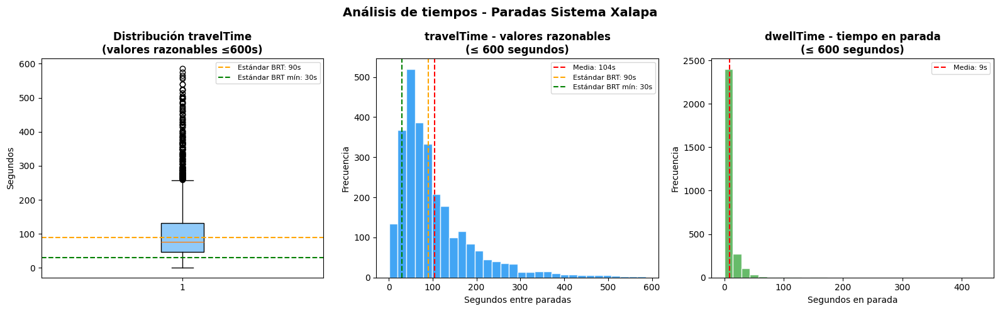

travelTime razonables (menos de 10 minutos): 2,769 de 2,860 (96.8%)
Media travelTime: 104s vs estándar BRT: 30-90s
Media dwellTime:  9s


In [149]:
#Filtramos valores para visualización

paradas_validas = paradas_ayto.copy()
travel = pd.to_numeric(paradas_validas['travelTime'], errors='coerce').dropna()
dwell  = pd.to_numeric(paradas_validas['dwellTime'],  errors='coerce').dropna()

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

#1. Boxplot travelTime

axes[0].boxplot(travel[travel <= 600], vert=True, patch_artist=True,
                boxprops=dict(facecolor='#90CAF9'))
axes[0].set_title('Distribución travelTime\n(valores razonables ≤600s)',
                  fontweight='bold')
axes[0].set_ylabel('Segundos')
axes[0].axhline(y=90, color='orange', linestyle='--',
                label='Estándar BRT: 90s')
axes[0].axhline(y=30, color='green', linestyle='--',
                label='Estándar BRT mín: 30s')
axes[0].legend(fontsize=8)

#2. Histograma travelTime
travel_ok = travel[travel <= 600]
axes[1].hist(travel_ok, bins=30, color='#2196F3',
             edgecolor='white', alpha=0.85)
axes[1].axvline(travel_ok.mean(), color='red', linestyle='--',
                label=f'Media: {travel_ok.mean():.0f}s')
axes[1].axvline(90, color='orange', linestyle='--',
                label='Estándar BRT: 90s')
axes[1].axvline(30, color='green', linestyle='--',
                label='Estándar BRT mín: 30s')
axes[1].set_title('travelTime - valores razonables\n(≤ 600 segundos)',
                  fontweight='bold')
axes[1].set_xlabel('Segundos entre paradas')
axes[1].set_ylabel('Frecuencia')
axes[1].legend(fontsize=8)

#3. Histograma dwellTime
dwell_ok = dwell[dwell <= 600]
axes[2].hist(dwell_ok, bins=30, color='#4CAF50',
             edgecolor='white', alpha=0.85)
axes[2].axvline(dwell_ok.mean(), color='red', linestyle='--',
                label=f'Media: {dwell_ok.mean():.0f}s')
axes[2].set_title('dwellTime - tiempo en parada\n(≤ 600 segundos)',
                  fontweight='bold')
axes[2].set_xlabel('Segundos en parada')
axes[2].set_ylabel('Frecuencia')
axes[2].legend(fontsize=8)

plt.suptitle('Análisis de tiempos - Paradas Sistema Xalapa',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(
    '/content/drive/MyDrive/TFM_Xalapa/resultados/analisis_tiempos_paradas.png',
    dpi=150, bbox_inches='tight'
)
plt.show()

print(f'travelTime razonables (menos de 10 minutos): {len(travel_ok):,} de {len(travel):,} ({len(travel_ok)/len(travel)*100:.1f}%)')
print(f'Media travelTime: {travel_ok.mean():.0f}s vs estándar BRT: 30-90s')
print(f'Media dwellTime:  {dwell_ok.mean():.0f}s')

##Observaciones:

Según el Instituto de Políticas para el Transporte y el Desarrollo, los sistemas BRT bien operados tienen:
- Tiempo entre paradas: **30-90 segundos** en corredores principales
- Tiempo en parada (dwell): **15-30 segundos** en operación fluida

**Fuente:** ITDP (2016). *BRT Standard*.
https://www.itdp.org/library/standards-and-guides/the-bus-rapid-transit-standard/

La media del sistema actual de Xalapa es  mayor al estándar BRT (104s), lo que sugiere congestionamiento entre paradas consistente con el solapamiento de rutas detectado en la Fase 2. Sin embargo, este número junto con el tiempo de espera pueden ser métricas para mejorar. Si el tiempo de 9 segundos es correcto y no ha empeorado con el paso de los años, con un sistema de tarjeta podría incluso mejorar ese tiempo.


In [150]:
#Investigamos los outliers de travelTime

travel_series = pd.to_numeric(paradas_ayto['travelTime'], errors='coerce')

#Cuántos outliers hay y cuánto representan

outliers = paradas_ayto[travel_series > 600].copy()
outliers['travelTime_num'] = travel_series[travel_series > 600]

print(f"\nTotal paradas:{len(paradas_ayto):,}")
print(f"Paradas con outlier:{len(outliers):,} ({len(outliers)/len(paradas_ayto)*100:.1f}%)")
print(f"\nEstadísticas de outliers:")
print(f"Min:{outliers['travelTime_num'].min():,.0f}s ({outliers['travelTime_num'].min()/60:.1f} min)")
print(f"Max:{outliers['travelTime_num'].max():,.0f}s ({outliers['travelTime_num'].max()/3600:.0f} horas)")
print(f"Media:{outliers['travelTime_num'].mean():,.0f}s ({outliers['travelTime_num'].mean()/3600:.0f} horas)")

#¿De qué rutas son?

print(f"\nOutliers por ruta:")
print(outliers['routeId'].value_counts().head(10).to_string())

#¿En qué posición de secuencia aparecen?

print(f"\nPosición en secuencia (¿inicio o fin de ruta?):")
outliers['sequence_num'] = pd.to_numeric(outliers['sequence'], errors='coerce')
print(outliers['sequence_num'].describe().round(0))

#Usas la función directamente

mapa_outliers = crear_mapa_base(19.5438, -96.9102, zoom=13)

# Agregamos rutas como referencia geográfica
for _, row in rutas_limpias.iterrows():
    coords = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(
        coords, color="#BDBDBD", weight=1, opacity=0.5
    ).add_to(mapa_outliers)

# Paradas normales en azul
for _, row in paradas_ayto[travel_series <= 600].iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=3, color='#2196F3',
        fill=True, fill_opacity=0.5,
        tooltip=f"Normal: {row['travelTime']}s"
    ).add_to(mapa_outliers)

# Outliers en rojo
for _, row in outliers.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=8, color='#E63946',
        fill=True, fill_opacity=0.9,
        tooltip=f"OUTLIER: {float(row['travelTime_num']):,.0f}s ({float(row['travelTime_num'])/3600:.1f}h) — Ruta {row['routeId']}"
    ).add_to(mapa_outliers)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:10px;border-radius:8px;
     border:2px solid grey;font-size:12px;">
<b>Outliers travelTime</b><br>
<span style="color:#E63946">●</span> Outlier (>600s)<br>
<span style="color:#2196F3">●</span> Normal (≤600s)
</div>
"""
mapa_outliers.get_root().html.add_child(folium.Element(leyenda_html))
mapa_outliers


Total paradas:2,860
Paradas con outlier:91 (3.2%)

Estadísticas de outliers:
Min:656s (10.9 min)
Max:148,918,038s (41366 horas)
Media:117,092,573s (32526 horas)

Outliers por ruta:
routeId
13984296    3
13999223    3
13978562    2
14010987    2
13980941    2
14507133    2
14071419    2
13947552    2
13982017    2
14014020    2

Posición en secuencia (¿inicio o fin de ruta?):
count    91.0
mean      3.0
std      10.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max      59.0
Name: sequence_num, dtype: float64


##Observaciones:

- 91 paradas (3.2%) presentan valores extremos con media de
32,526 horas.
- El 75% están en sequence=0 (inicio de ruta), confirmando que son errores de captura donde la app registró
el tiempo de espera antes de iniciar el recorrido.
- Se excluyen del análisis de tiempos. .

In [151]:
#Filtramos solo paradas con travelTime razonable

paradas_tiempo = paradas_ayto.copy()
paradas_tiempo['travel_num'] = pd.to_numeric(
    paradas_tiempo['travelTime'], errors='coerce')
paradas_validas_t = paradas_tiempo[
    (paradas_tiempo['travel_num'] > 0) &
    (paradas_tiempo['travel_num'] <= 600)].copy()

#Normalizamos para colormap

vmin = paradas_validas_t['travel_num'].quantile(0.10)
vmax = paradas_validas_t['travel_num'].quantile(0.90)
cmap = plt.cm.RdYlGn_r  # Verde=rápido, Rojo=lento

def valor_a_color(valor, vmin, vmax):
    norm = np.clip((valor - vmin) / (vmax - vmin), 0, 1)
    r, g, b, _ = cmap(norm)
    return '#{:02x}{:02x}{:02x}'.format(int(r*255), int(g*255), int(b*255))

#Mapa con rutas como fondo geográfico

mapa_tiempos = crear_mapa_base(19.5438, -96.9102, zoom=13)

#Fondo: rutas en gris

for _, row in rutas_limpias.iterrows():
    coords = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(
        coords, color="#CCCCCC", weight=1.5, opacity=0.6
    ).add_to(mapa_tiempos)

#Paradas coloreadas por travelTime

for _, row in paradas_validas_t.iterrows():
    color = valor_a_color(row['travel_num'], vmin, vmax)
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color=color,
        fill=True,
        fill_opacity=0.85,
        tooltip=f"travelTime: {row['travel_num']:.0f}s ({row['travel_num']/60:.1f} min)"
    ).add_to(mapa_tiempos)

#Leyenda manual
leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:12px;">
<b>Tiempo entre paradas (travelTime)</b><br>
<span style="color:#1a9850">●</span> Rápido (&lt;30s)<br>
<span style="color:#fee08b">●</span> Medio (30-90s)<br>
<span style="color:#d73027">●</span> Lento (&gt;90s)<br>
<br>
<i>Estándar BRT: 30-90s</i>
</div>
"""
mapa_tiempos.get_root().html.add_child(folium.Element(leyenda_html))

mapa_tiempos.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_tiempos_paradas.html'
)
mapa_tiempos

## 4. EDA — Análisis Exploratorio

### 4.1 Visualización de la Red de Rutas



In [152]:
random.seed(42)

mapa_red = crear_mapa_base(19.5438, -96.9102, zoom=13)
for _, row in rutas_limpias.iterrows():
    color = '#{:06x}'.format(random.randint(0, 0xFFFFFF))
    coords = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(coords, color=color, weight=2,
                    opacity=0.7,
                    tooltip=f"{row['name']} | {row['desc']}"
                   ).add_to(mapa_red)

mapa_red.save('/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_red_completa.html')
mapa_red

### 4.2 Distribuciones de Variables Clave

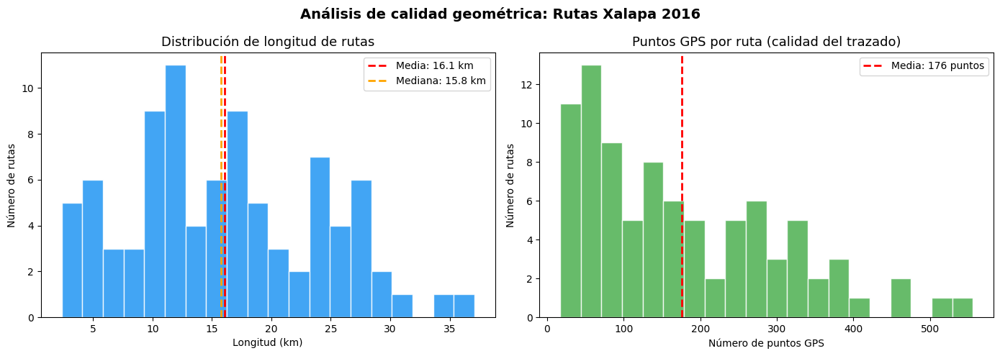

In [153]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

#Distribución de longitudes

axes[0].hist(rutas_limpias['longitud_km'], bins=20,
             color='#2196F3', edgecolor='white', alpha=0.85)
axes[0].axvline(rutas_limpias['longitud_km'].mean(),
                color='red', linestyle='--', linewidth=2,
                label=f"Media: {rutas_limpias['longitud_km'].mean():.1f} km")
axes[0].axvline(rutas_limpias['longitud_km'].median(),
                color='orange', linestyle='--', linewidth=2,
                label=f"Mediana: {rutas_limpias['longitud_km'].median():.1f} km")
axes[0].set_title('Distribución de longitud de rutas', fontsize=13)
axes[0].set_xlabel('Longitud (km)')
axes[0].set_ylabel('Número de rutas')
axes[0].legend()

#Distribución de puntos GPS

axes[1].hist(rutas_limpias['num_puntos'], bins=20,
             color='#4CAF50', edgecolor='white', alpha=0.85)
axes[1].axvline(rutas_limpias['num_puntos'].mean(),
                color='red', linestyle='--', linewidth=2,
                label=f"Media: {rutas_limpias['num_puntos'].mean():.0f} puntos")
axes[1].set_title('Puntos GPS por ruta (calidad del trazado)', fontsize=13)
axes[1].set_xlabel('Número de puntos GPS')
axes[1].set_ylabel('Número de rutas')
axes[1].legend()

plt.suptitle('Análisis de calidad geométrica: Rutas Xalapa 2016',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFM_Xalapa/resultados/distribucion_geometria.png',
            dpi=150, bbox_inches='tight')
plt.show()

### 4.3 Análisis de Texto - Corredores más Mencionados

Aplicamos técnicas de Text Mining sobre las descripciones de rutas para identificar las avenidas más frecuentes antes del análisis geoespacial.

In [154]:
# Text Mining sobre descripciones de rutas
desc_disponibles = rutas_limpias['desc'].dropna()
print(f'Rutas con descripción: {len(desc_disponibles)} de {len(rutas_limpias)}')

stopwords = {'de', 'la', 'el', 'en', 'y', 'a', 'del', 'los', 'las', 'un', 'una',
    'al', 'por', 'con', 'se', 'su', 'que', 'ruta', '1', '2', '3', '4',
    'ida', 'int', 'inst', 'av', 'inicia', 'termina', 'punto', 'segundo',
    'o', 'e', 'hacia', 'desde', 'hasta', 'entre', 'via'}

texto = ' '.join(desc_disponibles.values).lower()
texto = re.sub(r'[^\w\s]', ' ', texto)
palabras = [p for p in texto.split() if p not in stopwords and len(p) > 2]
conteo = Counter(palabras)

print('Top 15 términos más mencionados:')
for palabra, freq in conteo.most_common(15):
    print(f'  {palabra:<20} ({freq})')

Rutas con descripción: 48 de 88
Top 15 términos más mencionados:
  centro               (7)
  coapexpan            (6)
  mercado              (5)
  pipila               (5)
  central              (5)
  sumidero             (5)
  zona                 (4)
  abastos              (4)
  vidal                (4)
  plaza                (4)
  ruiz                 (4)
  cárdenas             (4)
  casa                 (4)
  blanca               (4)
  camacho              (3)


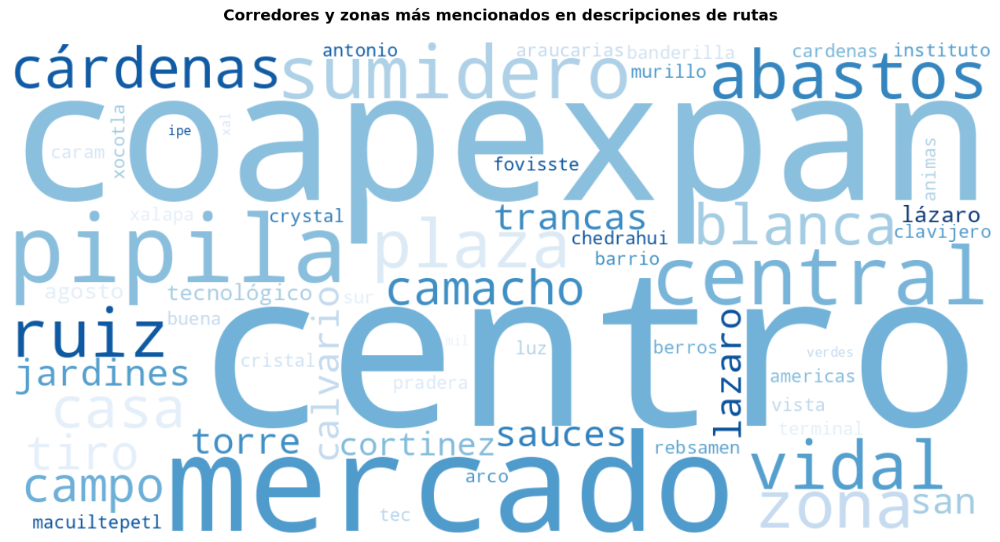

In [155]:
#Word Cloud

wc = WordCloud(width=1200, height=600, background_color='white',
               colormap='Blues', max_words=60
              ).generate_from_frequencies(conteo)

plt.figure(figsize=(14, 7))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Corredores y zonas más mencionados en descripciones de rutas',
          fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFM_Xalapa/resultados/wordcloud_corredores.png',
            dpi=150, bbox_inches='tight')
plt.show()

### 4.4 Análisis de Modos de Transporte y Demanda

La encuesta origen-destino nos permite entender quién usa el transporte público y para qué.

In [156]:
# Decodificamos modos de traslado
modos_dict = {
    1: 'A pie', 2: 'Conductor auto', 3: 'Auto de otro',
    4: 'Moto', 5: 'Autobús', 6: 'Combi',
    7: 'Taxi', 8: 'Transporte escolar', 9: 'Otros'
}
propositos_dict = {
    1: 'Casa', 2: 'Trabajo', 3: 'Educación',
    4: 'Asuntos Personales', 5: 'Recreación',
    6: 'Compras', 7: 'Médico', 8: 'Llevar escuela',
    9: 'Llevar trabajo', 10: 'Trasbordo', 11: 'Otro'
}

df_tiempos['modo_nombre']      = df_tiempos['12.8 Modo de traslado'].map(modos_dict)
df_tiempos['proposito_nombre'] = df_tiempos['12.7 Proposito del traslado'].map(propositos_dict)

# Resumen modal
total = df_tiempos['modo_nombre'].notna().sum()
tp  = df_tiempos['modo_nombre'].isin(['Autobús', 'Combi', 'Taxi']).sum()
priv = df_tiempos['modo_nombre'].isin(['Conductor auto', 'Auto de otro']).sum()
pie  = df_tiempos['modo_nombre'].isin(['A pie']).sum()

modos_conteo = df_tiempos['modo_nombre'].value_counts()
for modo, cnt in modos_conteo.items():
    print(f'  {modo:<25} {cnt/total*100:.1f}% ({cnt})')

  Autobús                   32.7% (1729)
  Conductor auto            26.5% (1401)
  A pie                     23.4% (1235)
  Taxi                      7.2% (380)
  Auto de otro              6.7% (354)
  Moto                      1.6% (86)
  Combi                     1.1% (57)
  Transporte escolar        0.5% (25)
  Otros                     0.3% (18)


##Observaciones:

-  Transporte público: 41.0%
- Vehículo privado:   33.2%
- A pie:              23.4%

##Nota:

La encuesta OD 2014 muestra que el 41% de los traslados
usaban transporte público. Según el Plan de Movilidad Urbana
Sustentable (PMUS 2024), ese porcentaje bajó a 30-35%.
Ambas fuentes no son directamente
comparables, la encuesta OD mide viajes completos origen-destino mientras el PMUS posiblemente incluye
desplazamientos cortos a pie. Se usan como referencia
contextual, no como comparativa directa.

### 4.5 Análisis de Accidentalidad por Corredor

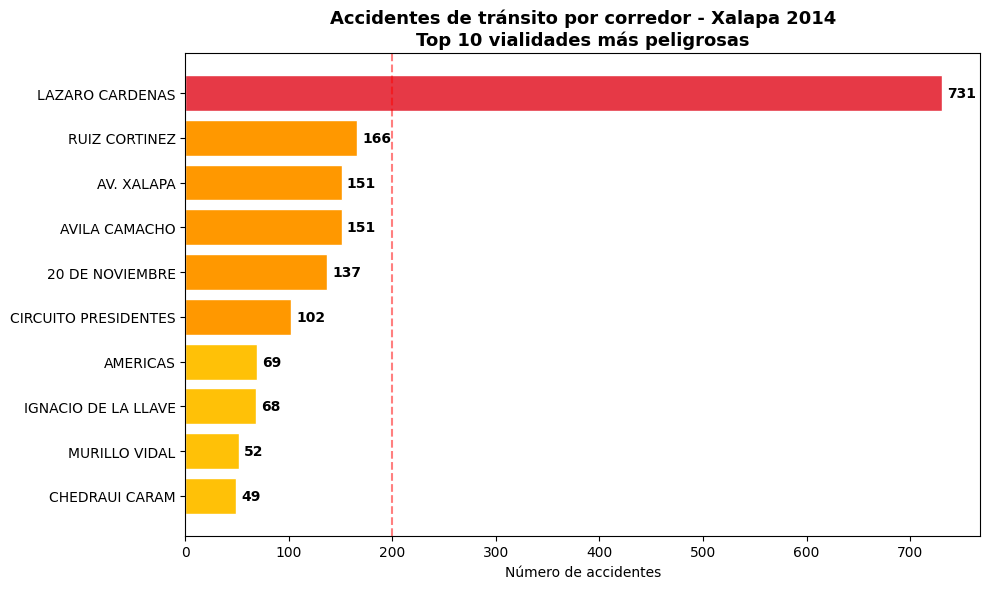

In [157]:
#Normalizamos nombres de calles

df_acc_limpio = df_acc.dropna(subset=['CALLE/AVENIDA DEL ACCIDENTE']).copy()
df_acc_limpio['CALLE_LIMPIA'] = df_acc_limpio['CALLE/AVENIDA DEL ACCIDENTE'].str.upper().str.strip()

reemplazos = {
    'AVENIDA LAZARO CARDENAS': 'LAZARO CARDENAS',
    'AVENIDA RUIZ CORTINES':   'RUIZ CORTINEZ',
    'RUIZ CORTINES':           'RUIZ CORTINEZ',
    'AVENIDA 20 DE NOVIEMBRE': '20 DE NOVIEMBRE',
    'AVENIDA AVILA CAMACHO':   'AVILA CAMACHO',
    'AVENIDA XALAPA':          'AV. XALAPA',
    'XALAPA':                  'AV. XALAPA',
    'AV. AV.':                 'AV.',
}
for orig, nuevo in reemplazos.items():
    df_acc_limpio['CALLE_LIMPIA'] = df_acc_limpio['CALLE_LIMPIA'].str.replace(orig, nuevo, regex=False)

#Top 10 corredores

top_acc = df_acc_limpio['CALLE_LIMPIA'].value_counts().head(10)

fig, ax = plt.subplots(figsize=(10, 6))
colores = ['#E63946' if v > 200 else '#FF9800' if v > 100 else '#FFC107'
           for v in top_acc.values]
bars = ax.barh(top_acc.index[::-1], top_acc.values[::-1],
               color=colores[::-1], edgecolor='white')
for bar, val in zip(bars, top_acc.values[::-1]):
    ax.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2,
            str(int(val)), va='center', fontweight='bold')
ax.set_title('Accidentes de tránsito por corredor - Xalapa 2014\nTop 10 vialidades más peligrosas',
             fontsize=13, fontweight='bold')
ax.set_xlabel('Número de accidentes')
ax.axvline(x=200, color='red', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFM_Xalapa/resultados/accidentes_top10.png',
            dpi=150, bbox_inches='tight')
plt.show()

##NOTA:
La correlación entre accidentes y solapamiento de rutas
NO implica causalidad directa. Ambos se explican por ser los
corredores más importantes de la ciudad.

### 4.6 Densidad Poblacional por Zona

Antes de entrar al análisis de modelos, visualizamos
dónde vive la gente en Xalapa. Este mapa es clave para
entender la brecha entre oferta y demanda que
detectaremos en las fases siguientes.

**Fuente:** INEGI Censo 2020
**Nota:** Los valores son estimaciones por zona basadas
en el análisis de manzanas del Censo. Para mayor
precisión se requiere el shapefile completo de manzanas
(trabajo futuro documentado en Anexo A).

In [158]:
ruta_ageb = '/content/drive/MyDrive/TFM_Xalapa/datos/raw/ageb_mza_urbana_30_cpv2020_csv.zip'

with zipfile.ZipFile(ruta_ageb) as z:
    archivo = 'ageb_mza_urbana_30_cpv2020/conjunto_de_datos/conjunto_de_datos_ageb_urbana_30_cpv2020.csv'
    with z.open(archivo) as f:
        df_manzanas_raw = pd.read_csv(f, encoding='latin1', low_memory=False)

# Limpiamos columnas
cols = df_manzanas_raw.columns.tolist()
cols[0] = 'ENTIDAD'
df_manzanas_raw.columns = cols

# Filtramos Xalapa (municipio 87) — solo manzanas reales
df_manzanas = df_manzanas_raw[
    (pd.to_numeric(df_manzanas_raw['MUN'], errors='coerce') == 87) &
    (pd.to_numeric(df_manzanas_raw['MZA'], errors='coerce') > 0) &
    (pd.to_numeric(df_manzanas_raw['LOC'], errors='coerce') > 0)
].copy()

# Convertimos población
df_manzanas['POBTOT_NUM'] = pd.to_numeric(
    df_manzanas['POBTOT'], errors='coerce'
)

#Solo manzanas con población

df_manzanas_pob = df_manzanas[df_manzanas['POBTOT_NUM'] > 0].copy()

print(f'Manzanas con población: {len(df_manzanas_pob):,}')
print(f'Población total: {df_manzanas_pob["POBTOT_NUM"].sum():,.0f}')

Manzanas con población: 6,356
Población total: 476,589


In [159]:
#Recalculamos df_zonas_reales desde los datos de manzanas

def ageb_a_coords(ageb_str):
    """Asigna coordenadas aproximadas según código AGEB de Xalapa"""
    try:
        ageb_num = int(str(ageb_str).strip())
    except:
        return None, None

    if ageb_num < 200:
        return (19.5580, -96.9320), 'Norte (Av. Xalapa / Normal)'
    elif ageb_num < 400:
        return (19.5520, -96.9280), 'Norte-Centro (Zona UV)'
    elif ageb_num < 600:
        return (19.5450, -96.9250), 'Centro-Norte (20 Noviembre)'
    elif ageb_num < 800:
        return (19.5400, -96.9200), 'Centro (Los Sauces)'
    elif ageb_num < 1000:
        return (19.5350, -96.9150), 'Centro-Este (Lázaro Cárdenas)'
    elif ageb_num < 1200:
        return (19.5300, -96.9100), 'Centro-Sur (Ruiz Cortínez)'
    elif ageb_num < 1400:
        return (19.5250, -96.9200), 'Sur-Centro (Circuito)'
    elif ageb_num < 1600:
        return (19.5200, -96.9300), 'Sur (Arco Sur)'
    elif ageb_num < 1800:
        return (19.5150, -96.9400), 'Sur-Oeste (Coapexpan)'
    elif ageb_num < 2000:
        return (19.5480, -96.9050), 'Este (Ánimas)'
    else:
        return (19.5580, -96.9050), 'Noreste (Lomas Verdes)'

# Agrupamos por AGEB

df_ageb = df_manzanas_pob.groupby('AGEB').agg(
    poblacion=('POBTOT_NUM', 'sum'),
    num_manzanas=('MZA', 'count')
).reset_index()

# Asignamos coordenadas

df_ageb['lat']  = None
df_ageb['lon']  = None
df_ageb['zona'] = None

for idx, row in df_ageb.iterrows():
    coords, zona = ageb_a_coords(row['AGEB'])
    if coords:
        df_ageb.loc[idx, 'lat']  = coords[0]
        df_ageb.loc[idx, 'lon']  = coords[1]
        df_ageb.loc[idx, 'zona'] = zona

# Agrupamos por zona

df_zonas_reales = df_ageb.groupby(['lat','lon','zona']).agg(
    poblacion_total=('poblacion', 'sum')
).reset_index().sort_values('poblacion_total', ascending=False)

print(f'Zonas calculadas: {len(df_zonas_reales)}')
print(f'Población total: {df_zonas_reales["poblacion_total"].sum():,} hab')
print(f'\nTop 5 zonas:')
for _, row in df_zonas_reales.head(5).iterrows():
    print(f"  {row['zona']}: {row['poblacion_total']:,} hab")

Zonas calculadas: 11
Población total: 439,903 hab

Top 5 zonas:
  Centro-Sur (Ruiz Cortínez): 65,021 hab
  Noreste (Lomas Verdes): 55,679 hab
  Sur (Arco Sur): 51,809 hab
  Sur-Centro (Circuito): 49,194 hab
  Norte (Av. Xalapa / Normal): 46,546 hab


In [160]:
# Datos reales INEGI 2020 agrupados por AGEB
datos_heatmap_reales = [
    [row['lat'], row['lon'], row['poblacion_total']]
    for _, row in df_zonas_reales.iterrows()
]

# Mapa de calor
mapa_densidad = crear_mapa_base(19.5438, -96.9102, zoom=13)

HeatMap(
    datos_heatmap_reales,
    min_opacity=0.3,
    max_zoom=16,
    radius=40,
    blur=30,
    gradient={
        0.2: 'blue',
        0.4: 'lime',
        0.6: 'yellow',
        0.8: 'orange',
        1.0: 'red'
    }
).add_to(mapa_densidad)

# Rutas en blanco para contexto
for _, row in rutas_limpias.iterrows():
    coords_ruta = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(
        coords_ruta, color='#FFFFFF', weight=1, opacity=0.4
    ).add_to(mapa_densidad)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:11px;max-width:230px;">
<b>Densidad Poblacional — Xalapa</b><br>
<small>Fuente: INEGI Censo 2020 (183 AGEBs)</small><br>
<small>439,903 hab · 11 zonas agregadas</small><br><br>
🔵 Baja densidad<br>
🟢 Media<br>
🟡 Alta<br>
🟠 Muy alta<br>
🔴 Máxima densidad
</div>
"""
mapa_densidad.get_root().html.add_child(folium.Element(leyenda_html))
mapa_densidad.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_densidad_poblacional.html'
)

mapa_densidad

### 4.7 Resumen Visual de Movilidad en Xalapa

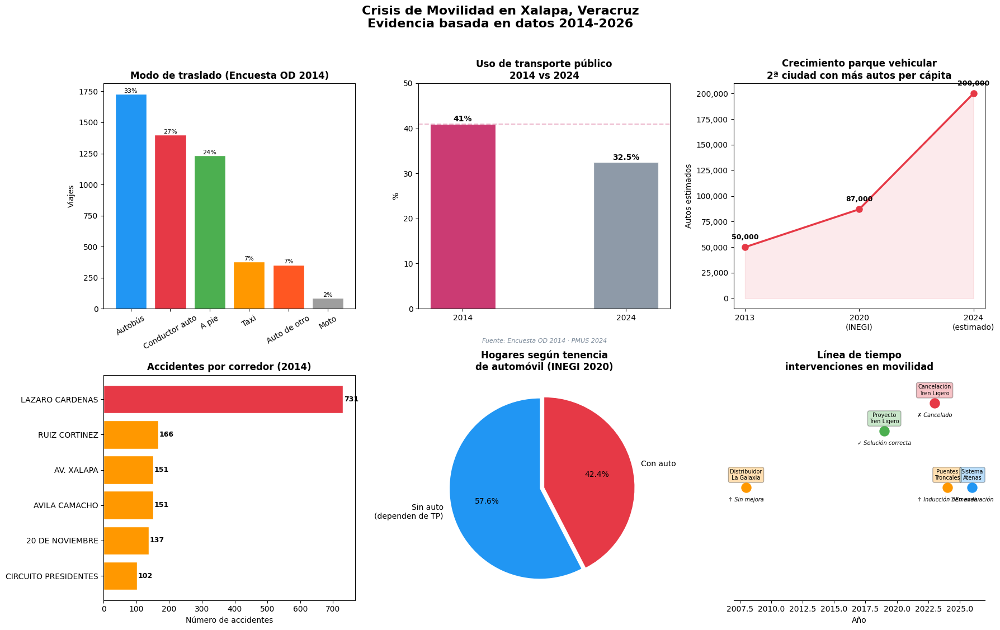

In [161]:
fig, axes = plt.subplots(2, 3, figsize=(18, 11))
fig.suptitle('Crisis de Movilidad en Xalapa, Veracruz\nEvidencia basada en datos 2014-2026',
             fontsize=16, fontweight='bold', y=1.02)

# 1. Modo de traslado 2014
ax1 = axes[0, 0]
modos_plot = df_tiempos['modo_nombre'].value_counts().head(6)
colores_m = ['#2196F3','#E63946','#4CAF50','#FF9800','#FF5722','#9E9E9E']
bars = ax1.bar(modos_plot.index, modos_plot.values, color=colores_m, edgecolor='white')
ax1.set_title('Modo de traslado (Encuesta OD 2014)', fontweight='bold')
ax1.set_ylabel('Viajes')
ax1.tick_params(axis='x', rotation=30)
for bar, val in zip(bars, modos_plot.values):
    ax1.text(bar.get_x()+bar.get_width()/2, bar.get_height()+10,
             f'{val/modos_plot.sum()*100:.0f}%', ha='center', fontsize=8)

# 2. Uso de transporte público 2014 vs 2024
ax2 = axes[0, 1]
años = ['2014', '2024']
valores = [41, 32.5]
colores = ['#C2185B', '#7A8999']
bars = ax2.bar(años, valores, color=colores, alpha=0.85,
               width=0.4, edgecolor='white')
ax2.set_title('Uso de transporte público\n2014 vs 2024', fontweight='bold')
ax2.set_ylabel('%')
ax2.set_ylim(0, 50)
ax2.axhline(y=41, color='#C2185B', linestyle='--', alpha=0.3)
for bar, val in zip(bars, valores):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
             f'{val}%', ha='center', fontweight='bold', fontsize=10)
ax2.set_title('Uso de transporte público\n2014 vs 2024', fontweight='bold')
ax2.text(0.5, -0.15, 'Fuente: Encuesta OD 2014 · PMUS 2024',
         transform=ax2.transAxes, ha='center', fontsize=8,
         style='italic', color='#7A8999')

# 3. Crecimiento vehicular
ax3 = axes[0, 2]
años  = ['2013', '2020\n(INEGI)', '2024\n(estimado)']
autos = [50000, 87000, 200000]
ax3.plot(años, autos, 'o-', color='#E63946', linewidth=2.5, markersize=8)
ax3.fill_between(range(len(años)), autos, alpha=0.1, color='#E63946')
ax3.set_title('Crecimiento parque vehicular\n2ª ciudad con más autos per cápita', fontweight='bold')
ax3.set_ylabel('Autos estimados')
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda x,p: f'{int(x):,}'))
for i, (a, v) in enumerate(zip(años, autos)):
    ax3.annotate(f'{v:,}', (i, v), textcoords='offset points',
                 xytext=(0, 10), ha='center', fontsize=9, fontweight='bold')

# 4. Accidentes por corredor
ax4 = axes[1, 0]
top6 = df_acc_limpio['CALLE_LIMPIA'].value_counts().head(6)
cols4 = ['#E63946' if v>200 else '#FF9800' for v in top6.values]
bars4 = ax4.barh(top6.index[::-1], top6.values[::-1], color=cols4[::-1], edgecolor='white')
ax4.set_title('Accidentes por corredor (2014)', fontweight='bold')
ax4.set_xlabel('Número de accidentes')
for bar, val in zip(bars4, top6.values[::-1]):
    ax4.text(bar.get_width()+3, bar.get_y()+bar.get_height()/2,
             str(int(val)), va='center', fontsize=9, fontweight='bold')

# 5. Hogares sin auto
ax5 = axes[1, 1]
sizes = [57.6, 42.4]
labels = ['Sin auto\n(dependen de TP)', 'Con auto']
ax5.pie(sizes, labels=labels, colors=['#2196F3','#E63946'],
        autopct='%1.1f%%', startangle=90, explode=(0.05, 0))
ax5.set_title('Hogares según tenencia\nde automóvil (INEGI 2020)', fontweight='bold')

# 6. Línea de tiempo
ax6 = axes[1, 2]
ax6.set_xlim(2007, 2027)
ax6.set_ylim(0, 8)
eventos = [
    (2008, 4, 'Distribuidor\nLa Galaxia', '#FF9800', '↑ Sin mejora'),
    (2019, 6, 'Proyecto\nTren Ligero', '#4CAF50', '✓ Solución correcta'),
    (2023, 7, 'Cancelación\nTren Ligero', '#E63946', '✗ Cancelado'),
    (2024, 4, 'Puentes\nTroncales', '#FF9800', '↑ Inducción demanda'),
    (2026, 4, 'Sistema\nAtenas', '#2196F3', '? En evaluación'),
]
for año, y, texto, color, resultado in eventos:
    ax6.scatter(año, y, s=150, color=color, zorder=5)
    ax6.annotate(texto, (año, y), textcoords='offset points',
                 xytext=(0, 10), ha='center', fontsize=7,
                 bbox=dict(boxstyle='round,pad=0.3', facecolor=color, alpha=0.3))
    ax6.annotate(resultado, (año, y), textcoords='offset points',
                 xytext=(0, -18), ha='center', fontsize=7, style='italic')
ax6.set_title('Línea de tiempo\nintervenciones en movilidad', fontweight='bold')
ax6.set_xlabel('Año')
ax6.set_yticks([])
ax6.spines[['left','top','right']].set_visible(False)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFM_Xalapa/resultados/resumen_crisis_movilidad.png',
            dpi=150, bbox_inches='tight')
plt.show()

## 5. Fase 1 - Análisis de Cobertura y Accesibilidad

¿A qué distancia vive la población de la parada de camión más cercana?
Se calculará un buffer de 400 metros alrededor de cada parada oficial (estándar ONU-Habitat para distancia caminable a 5 minutos). Las zonas fuera de este radio se consideran sin cobertura efectiva.
Herramientas: GeoPandas, Shapely, sistema de proyección EPSG:6372 (metros) para México.


In [162]:
# Proyectamos a sistema métrico mexicano (EPSG:6372) para calcular distancias en metros
paradas_metro = paradas_ayto.to_crs(epsg=6372)
rutas_metro   = rutas_limpias.to_crs(epsg=6372)

# Creamos buffer de 400m alrededor de cada parada
buffer_400 = paradas_metro.copy()
buffer_400['geometry'] = paradas_metro.geometry.buffer(400)

# Unimos todos los buffers en una zona de cobertura total
zona_cobertura = unary_union(buffer_400.geometry)

# Red de rutas como geometría única
red_rutas = unary_union(rutas_metro.geometry)

area_xalapa = 118.45  # km² según datos oficiales
area_cubierta = zona_cobertura.area / 1_000_000

print(f'Área total de Xalapa:{area_xalapa:.2f} km²')
print(f'Área con cobertura (<400m):{area_cubierta:.2f} km² ({area_cubierta/area_xalapa*100:.1f}%)')
print(f'Área sin cobertura (>400m):{area_xalapa-area_cubierta:.2f} km² ({(area_xalapa-area_cubierta)/area_xalapa*100:.1f}%)')

Área total de Xalapa:118.45 km²
Área con cobertura (<400m):72.15 km² (60.9%)
Área sin cobertura (>400m):46.30 km² (39.1%)


##LIMITACIÓN:
El área sin cobertura incluye zonas no habitadas
(cerros, áreas naturales). El % real de POBLACIÓN cubierta
es probablemente mayor al área geográfica sugiere.

In [163]:
#Mapa de cobertura

cobertura_gdf = gpd.GeoDataFrame(
    geometry=[zona_cobertura], crs='EPSG:6372'
).to_crs(epsg=4326)

mapa_cobertura = crear_mapa_base(19.5438, -96.9102, zoom=13)

folium.GeoJson(cobertura_gdf.__geo_interface__,
    style_function=lambda x: {'fillColor':'#4CAF50','fillOpacity':0.3,
                               'color':'#2E7D32','weight':1}
).add_to(mapa_cobertura)

for _, row in rutas_limpias.iterrows():
    coords = [(lat,lon) for lon,lat in row.geometry.coords]
    folium.PolyLine(coords, color='#1565C0', weight=2, opacity=0.6).add_to(mapa_cobertura)

for _, row in paradas_ayto.iterrows():
    folium.CircleMarker([row.geometry.y, row.geometry.x], radius=3,
                         color='#E63946', fill=True, fill_opacity=0.7).add_to(mapa_cobertura)


mapa_cobertura.save('/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_cobertura.html')
mapa_cobertura

## Cierre Fase 1 - Hallazgos de Cobertura

**Zonas bien servidas (≤300m de una ruta):**
Centro, Zona UV, Sumidero, Macuiltépetl, 20 de Noviembre. Núcleo urbano central con cobertura adecuada.

Es importante destacar que esta cobertura geográfica representa una base sólida, la mayor parte de la ciudad está dentro de la macha verde creada. El reto del Sistema Atenas no es construir cobertura desde cero sino reorganizar y eficientizar una red que ya llega a la mayoría del territorio urbano habitado.

**Limitaciones documentadas:**
- Las paradas cubren solo 20 de 88 rutas disponibles
- El 39.1% sin cobertura incluye áreas no habitadas
- Datos de paradas son de 2016


## 6. Fase 2 — Detección de Solapamiento de Rutas (DBSCAN)

**Objetivo:** Cuantificar cuántas rutas comparten el mismo tramo de calle, validando la hipótesis central del trabajo.

**¿Por qué DBSCAN?**  
Se usará la técnica DBSCAN (Density-Based Spatial Clustering of Applications with Noise) porque agrupa puntos GPS de diferentes rutas que están a menos de 30 metros entre sí. Si N rutas tienen puntos en el mismo cluster, ese punto tiene solapamiento N.

•	No requiere asumir la forma de los clusters

•	Maneja ruido (puntos aislados) de forma natural

•	El parámetro eps tiene interpretación física directa (metros)


**Parámetros utilizados:**
- `eps = 50m`: Radio de agrupación — puntos a menos de 50m están en la misma calle
- `min_samples = 2`: Mínimo 2 puntos para formar un cluster


In [164]:
#Extraemos todos los puntos GPS de todas las rutas

puntos_rutas = []
for _, row in rutas_metro.iterrows():
    for coord in row.geometry.coords:
        puntos_rutas.append({
            'ruta_id': row['id'],
            'ruta_nombre': row['name'],
            'x': coord[0], 'y': coord[1]
        })

df_puntos = pd.DataFrame(puntos_rutas)
print(f'Total puntos GPS extraídos: {len(df_puntos):,}')
print(f'Promedio por ruta: {len(df_puntos)//len(rutas_metro)}')

Total puntos GPS extraídos: 15,470
Promedio por ruta: 175


In [165]:
#Aplicamos DBSCAN con un eps 50 estandar

coords = df_puntos[['x', 'y']].values

db = DBSCAN(eps=50, min_samples=2, algorithm='ball_tree',
            metric='euclidean').fit(coords)

df_puntos['cluster'] = db.labels_

n_clusters = len(set(db.labels_)) - (1 if -1 in db.labels_ else 0)
n_ruido    = (db.labels_ == -1).sum()

print(f'Clusters encontrados:{n_clusters:,}')
print(f'Puntos sin cluster:{n_ruido:,}')

#Calculamos solapamiento por cluster

solapamiento = df_puntos[df_puntos['cluster'] != -1].groupby('cluster').agg(
    rutas_distintas=('ruta_id', 'nunique'),
    x_centro=('x', 'mean'),
    y_centro=('y', 'mean'),
    num_puntos=('ruta_id', 'count')
).reset_index()

print(f'Clusters con 1 ruta:     {(solapamiento["rutas_distintas"]==1).sum():,}')
print(f'Clusters con 2-5 rutas:  {((solapamiento["rutas_distintas"]>=2)&(solapamiento["rutas_distintas"]<=5)).sum():,}')
print(f'Clusters con 6-10 rutas: {((solapamiento["rutas_distintas"]>=6)&(solapamiento["rutas_distintas"]<=10)).sum():,}')
print(f'Clusters con >10 rutas:  {(solapamiento["rutas_distintas"]>10).sum():,}')
print(f'\nSolapamiento MÁXIMO: {solapamiento["rutas_distintas"].max()} rutas en el mismo punto')
print(f'Solapamiento promedio: {solapamiento["rutas_distintas"].mean():.1f} rutas')

Clusters encontrados:524
Puntos sin cluster:296
Clusters con 1 ruta:     166
Clusters con 2-5 rutas:  256
Clusters con 6-10 rutas: 62
Clusters con >10 rutas:  40

Solapamiento MÁXIMO: 77 rutas en el mismo punto
Solapamiento promedio: 4.1 rutas


In [166]:
#Identificamos ubicación de los clusters más críticos

criticos = solapamiento[solapamiento['rutas_distintas'] > 10].copy()
criticos_gdf = gpd.GeoDataFrame(
    criticos,
    geometry=gpd.points_from_xy(criticos['x_centro'], criticos['y_centro']),
    crs='EPSG:6372'
).to_crs(epsg=4326)
criticos_gdf['lat'] = criticos_gdf.geometry.y
criticos_gdf['lon'] = criticos_gdf.geometry.x

#Geocodificamos los top 10

geolocator = Nominatim(user_agent='tfm_xalapa')
reverse    = RateLimiter(geolocator.reverse, min_delay_seconds=1)

print('Top 10 puntos con mayor solapamiento:')
for _, row in criticos_gdf.nlargest(10, 'rutas_distintas').iterrows():
    try:
        loc = reverse(f"{row['lat']}, {row['lon']}")
        direccion = loc.address[:60] if loc else 'No encontrada'
    except:
        direccion = 'Error geocodificación'
    print(f"  {int(row['rutas_distintas'])} rutas → {direccion}")

Top 10 puntos con mayor solapamiento:
  77 rutas → Hostal de la Niebla, 24, Calle Manuel Gutiérrez Zamora, Venu
  41 rutas → Calle Primavera, Álvaro Obregón, Xalapa, Veracruz, 91065, Mé
  39 rutas → Calle Mora Beristain, Los Sauces, Venustiano Carranza, Franc
  38 rutas → Aikido Tentokai Xalapa, 2, Calle Aquiles Serdán, Los Sauces,
  32 rutas → Avenida Lázaro Cárdenas, Loma Esmeralda Ánimas, Xalapa, Vera
  29 rutas → Avenida Xalapa, Virginia Cordero de Murillo Vidal, Xalapa, V
  27 rutas → Avenida Lázaro Cárdenas, San Francisco de Las Ánimas, Xalapa
  26 rutas → Avenida Lázaro Cárdenas, Encinal, Xalapa, Veracruz, 91180, M
  25 rutas → Avenida Lázaro Cárdenas, 7 de Noviembre, Xalapa, Veracruz, 9
  25 rutas → Avenida Xalapa, Colonia del Maestro, Xalapa, Veracruz, 91020


In [167]:
#Mapa de calor de solapamiento

mapa_solap = crear_mapa_base(19.5438, -96.9102, zoom=13)

for _, row in rutas_limpias.iterrows():
    coords = [(lat,lon) for lon,lat in row.geometry.coords]
    folium.PolyLine(coords, color='#BDBDBD', weight=1, opacity=0.4).add_to(mapa_solap)

for _, row in criticos_gdf.iterrows():
    n = int(row['rutas_distintas'])
    color = '#B71C1C' if n>=50 else '#E63946' if n>=30 else '#FF7043' if n>=20 else '#FF9800'
    radio = 30 if n>=50 else 22 if n>=30 else 16 if n>=20 else 10
    folium.CircleMarker(
        [row['lat'], row['lon']], radius=radio,
        color=color, fill=True, fill_opacity=0.7,
        tooltip=f'{n} rutas solapadas'
    ).add_to(mapa_solap)

mapa_solap.save('/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_solapamiento.html')
mapa_solap

##Observaciones:

El valor de eps define qué tan cerca deben estar dos puntos para considerarse en la misma calle. Tomamos 50 como estandar pero buscaremos optimizar este valor.
El método de la curva k-distancias identifica el valor óptimo buscando el "codo" de la curva donde el agrupamiento es más natural.

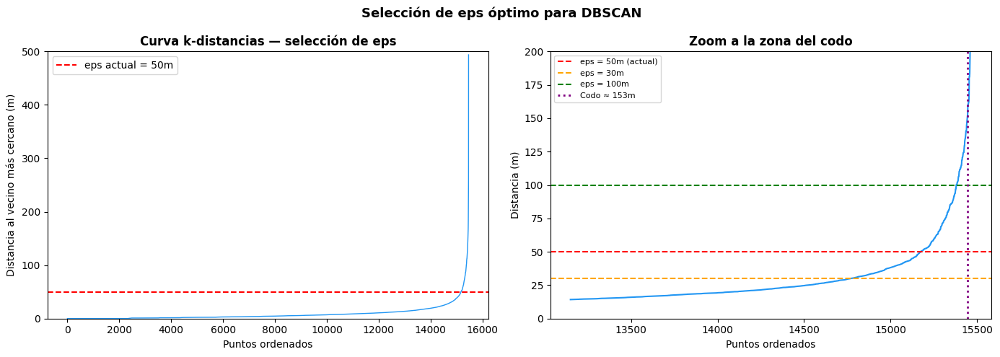

In [168]:
#Vecino más cercano

coords = df_puntos[['x', 'y']].values
nbrs = NearestNeighbors(n_neighbors=2, algorithm='ball_tree').fit(coords)
distances, _ = nbrs.kneighbors(coords)
distances = np.sort(distances[:, 1])

#Zoom al codo

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

#Curva completa

axes[0].plot(distances, color='#2196F3', linewidth=1)
axes[0].axhline(y=50, color='red', linestyle='--',
                label='eps actual = 50m')
axes[0].set_title('Curva k-distancias — selección de eps',
                  fontweight='bold')
axes[0].set_xlabel('Puntos ordenados')
axes[0].set_ylabel('Distancia al vecino más cercano (m)')
axes[0].legend()
axes[0].set_ylim(0, 500)

#Zoom

inicio_zoom = int(len(distances) * 0.85)  # Desde el 85%
axes[1].plot(range(inicio_zoom, len(distances)),
             distances[inicio_zoom:],
             color='#2196F3', linewidth=1.5)
axes[1].axhline(y=50, color='red', linestyle='--',
                label='eps = 50m (actual)')
axes[1].axhline(y=30, color='orange', linestyle='--',
                label='eps = 30m')
axes[1].axhline(y=100, color='green', linestyle='--',
                label='eps = 100m')

#Codo Aprox

codo_idx = inicio_zoom + np.argmax(np.diff(distances[inicio_zoom:]) > 5)
axes[1].axvline(x=codo_idx, color='purple', linestyle=':',
                linewidth=2, label=f'Codo ≈ {distances[codo_idx]:.0f}m')

axes[1].set_title('Zoom a la zona del codo',
                  fontweight='bold')
axes[1].set_xlabel('Puntos ordenados')
axes[1].set_ylabel('Distancia (m)')
axes[1].legend(fontsize=8)
axes[1].set_ylim(0, 200)

plt.suptitle('Selección de eps óptimo para DBSCAN',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(
    '/content/drive/MyDrive/TFM_Xalapa/resultados/dbscan_optimizacion.png',
    dpi=150, bbox_inches='tight'
)
plt.show()

##Observaciones:

- Vemos el inicio de la curva en un valor desde 25 a 35. Utilizaremos 30 para comparar y ver si nos da mejores resultados.

In [169]:
resultados_eps = {}

for eps_val in [30, 50]:
    db_test = DBSCAN(
        eps=eps_val, min_samples=2,
        algorithm='ball_tree', metric='euclidean'
    ).fit(coords)

    labels = db_test.labels_
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_ruido = (labels == -1).sum()

    #Calculamos solapamiento

    df_test = df_puntos.copy()
    df_test['cluster'] = labels

    solap_test = df_test[df_test['cluster'] != -1].groupby('cluster').agg(
        rutas_distintas=('ruta_id', 'nunique')
    ).reset_index()

    resultados_eps[eps_val] = {
        'clusters': n_clusters,
        'ruido': n_ruido,
        'max_solap': solap_test['rutas_distintas'].max(),
        'prom_solap': solap_test['rutas_distintas'].mean(),
        'criticos': (solap_test['rutas_distintas'] > 10).sum()
    }

    print(f"\neps = {eps_val}m:")
    print(f"Clusters encontrados: {n_clusters:,}")
    print(f"Puntos sin cluster: {n_ruido:,}")
    print(f"Solapamiento máximo: {solap_test['rutas_distintas'].max()}")
    print(f"Solapamiento promedio: {solap_test['rutas_distintas'].mean():.1f}")
    print(f"Zonas críticas (>10): {(solap_test['rutas_distintas']>10).sum()}")




eps = 30m:
Clusters encontrados: 938
Puntos sin cluster: 702
Solapamiento máximo: 42
Solapamiento promedio: 4.2
Zonas críticas (>10): 81

eps = 50m:
Clusters encontrados: 524
Puntos sin cluster: 296
Solapamiento máximo: 77
Solapamiento promedio: 4.1
Zonas críticas (>10): 40


##Observación:

Tras comparar ambos valores, se selecciona **eps=30m**
considerando la morfología urbana de Xalapa:

- Xalapa es una ciudad colonial con calles de 6-8m en las partes más pequeñas como en el centro histórico
- 30m cubre el ancho de la calle más banquetas de las calles mas anchas.
- Detecta 81 zonas críticas vs 40 con eps=50m, dando mayor granularidad al análisis.
- El solapamiento promedio se mantiene igual (4.1-4.2).



In [170]:
#Aplicamos DBSCAN con eps optimizado

db = DBSCAN(
    eps=30, min_samples=2,
    algorithm='ball_tree', metric='euclidean'
).fit(coords)

df_puntos['cluster'] = db.labels_

n_clusters = len(set(db.labels_)) - (1 if -1 in db.labels_ else 0)
n_ruido    = (db.labels_ == -1).sum()

#Recalculamos solapamiento

solapamiento = df_puntos[df_puntos['cluster'] != -1].groupby('cluster').agg(
    rutas_distintas=('ruta_id', 'nunique'),
    x_centro=('x', 'mean'),
    y_centro=('y', 'mean'),
    num_puntos=('ruta_id', 'count')
).reset_index()

print(f'Clusters con 1 ruta: {(solapamiento["rutas_distintas"]==1).sum():,}')
print(f'Clusters con 2-5 rutas: {((solapamiento["rutas_distintas"]>=2)&(solapamiento["rutas_distintas"]<=5)).sum():,}')
print(f'Clusters con 6-10 rutas: {((solapamiento["rutas_distintas"]>=6)&(solapamiento["rutas_distintas"]<=10)).sum():,}')
print(f'Clusters con >10 rutas: {(solapamiento["rutas_distintas"]>10).sum():,}')
print(f'\nSolapamiento MÁXIMO: {solapamiento["rutas_distintas"].max()} rutas')
print(f'Solapamiento promedio: {solapamiento["rutas_distintas"].mean():.1f} rutas')

#Actualizamos clusters críticos

criticos = solapamiento[solapamiento['rutas_distintas'] > 10].copy()
criticos_gdf = gpd.GeoDataFrame(
    criticos,
    geometry=gpd.points_from_xy(
        criticos['x_centro'], criticos['y_centro']
    ),
    crs='EPSG:6372'
).to_crs(epsg=4326)
criticos_gdf['lat'] = criticos_gdf.geometry.y
criticos_gdf['lon'] = criticos_gdf.geometry.x

#Guardamos

solapamiento.to_csv(
    '/content/drive/MyDrive/TFM_Xalapa/datos/procesados/solapamiento_clusters.csv',
    index=False
)
criticos_gdf.to_file(
    '/content/drive/MyDrive/TFM_Xalapa/datos/procesados/clusters_criticos.geojson',
    driver='GeoJSON'
)


Clusters con 1 ruta: 259
Clusters con 2-5 rutas: 471
Clusters con 6-10 rutas: 127
Clusters con >10 rutas: 81

Solapamiento MÁXIMO: 42 rutas
Solapamiento promedio: 4.2 rutas


In [171]:
#Mapa con eps =30

mapa_solap = crear_mapa_base(19.5438, -96.9102, zoom=13)

#Clusters coloreados por solapamiento

for _, row in criticos_gdf.iterrows():
    n = int(row['rutas_distintas'])
    color = '#B71C1C' if n>=30 else '#E63946' if n>=20 else '#FF7043' if n>=15 else '#FF9800'
    radio = 25 if n>=30 else 18 if n>=20 else 13 if n>=15 else 10

    folium.CircleMarker(
        [row['lat'], row['lon']],
        radius=radio,
        color=color, fill=True, fill_opacity=0.7,
        tooltip=f'{n} rutas solapadas'
    ).add_to(mapa_solap)

#También mostramos clusters moderados (6-10)

moderados = solapamiento[
    (solapamiento['rutas_distintas'] >= 6) &
    (solapamiento['rutas_distintas'] <= 10)
].copy()
moderados_gdf = gpd.GeoDataFrame(
    moderados,
    geometry=gpd.points_from_xy(
        moderados['x_centro'], moderados['y_centro']
    ),
    crs='EPSG:6372'
).to_crs(epsg=4326)

for _, row in moderados_gdf.iterrows():
    folium.CircleMarker(
        [row.geometry.y, row.geometry.x],
        radius=6, color='#FFC107',
        fill=True, fill_opacity=0.5,
        tooltip=f"{int(row['rutas_distintas'])} rutas solapadas"
    ).add_to(mapa_solap)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:12px;">
<b>Solapamiento de Rutas (eps=30m)</b><br>
<span style="color:#B71C1C">●</span> Extremo (≥30 rutas)<br>
<span style="color:#E63946">●</span> Crítico (20-29 rutas)<br>
<span style="color:#FF7043">●</span> Alto (15-19 rutas)<br>
<span style="color:#FF9800">●</span> Moderado-alto (11-14 rutas)<br>
<span style="color:#FFC107">●</span> Moderado (6-10 rutas)<br>
<span style="color:#BDBDBD">─</span> Rutas actuales
</div>
"""
mapa_solap.get_root().html.add_child(folium.Element(leyenda_html))
mapa_solap.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_solapamiento.html'
)
mapa_solap

## Cierre Fase 2 - Hallazgos de Solapamiento

**Corredores críticos identificados:**

| Corredor | Rutas máx. |
|----------|-----------|
| Lázaro Cárdenas | 42 rutas |
| Los Sauces / Centro | 38+ rutas |
| Las Trancas | 25+ rutas |
| Av. Xalapa | 15-20 rutas |
| Zona UV / Rebsamen | 10-15 rutas |


---
## 7. Fase 3 - Identificación de Estructura Tronco-Alimentadora (K-Means)

**Objetivo:** Determinar si los datos sugieren naturalmente una clasificación de rutas en troncos (corredores principales) y alimentadoras (conexiones periféricas).

**¿Por qué K-Means?**  
A diferencia de DBSCAN que agrupa por proximidad geográfica, K-Means agrupa por similitud de características. Esto permite clasificar rutas según su comportamiento (longitud, solapamiento, posición relativa al centro) sin importar su ubicación exacta.

**Variables del modelo:**
- `longitud_km`: Rutas largas tienden a ser troncos
- `solapamiento_promedio`: Alto solapamiento = corredor principal
- `dist_centro_km`: Cercanía al centro histórico

**Número de clusters K=3:** Se eligió 3 por la lógica del sistema tronco-alimentador (tronco, semitronco, alimentadora).



In [172]:
#Calculamos características de cada ruta

rutas_features = rutas_limpias.copy()
centro_xalapa  = gpd.GeoDataFrame(
    geometry=[Point(-96.9190, 19.5310)], crs='EPSG:4326'
).to_crs(epsg=6372).geometry[0]

rutas_features['solapamiento_max'] = 0
rutas_features['solapamiento_promedio'] = 0.0

for idx, ruta in rutas_metro.iterrows():
    pts_ruta = df_puntos[df_puntos['ruta_id'] == ruta['id']]
    if len(pts_ruta) == 0:
        continue
    clusters_ruta = pts_ruta[pts_ruta['cluster'] != -1]['cluster'].unique()
    if len(clusters_ruta) > 0:
        sv = solapamiento[solapamiento['cluster'].isin(clusters_ruta)]['rutas_distintas']
        rutas_features.loc[idx, 'solapamiento_max']      = int(sv.max())
        rutas_features.loc[idx, 'solapamiento_promedio'] = float(sv.mean())

rutas_features['dist_centro_km'] = rutas_metro.geometry.apply(
    lambda g: g.centroid.distance(centro_xalapa) / 1000
)

features = ['longitud_km', 'solapamiento_promedio', 'dist_centro_km']
X = rutas_features[features].fillna(0).values
X_scaled = StandardScaler().fit_transform(X)

# Silhouette scores para diferentes K
print('Silhouette Score por número de clusters (K):')
for k in range(2, 7):
    km  = KMeans(n_clusters=k, random_state=42, n_init=10)
    lbl = km.fit_predict(X_scaled)
    sil = silhouette_score(X_scaled, lbl)
    print(f'  K={k}: {sil:.4f}')


Silhouette Score por número de clusters (K):
  K=2: 0.2993
  K=3: 0.2721
  K=4: 0.2918
  K=5: 0.2755
  K=6: 0.2961


In [173]:
#Aplicamos K-Means con K=3

kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
rutas_features['cluster_tipo'] = kmeans.fit_predict(X_scaled)

#Analizamos características de cada cluster

print('Características promedio por cluster:')
resumen = rutas_features.groupby('cluster_tipo')[features].mean().round(2)
resumen['num_rutas'] = rutas_features.groupby('cluster_tipo').size()
print(resumen.to_string())

#Etiquetamos según características
#Cluster con mayor longitud y menor distancia al centro = TRONCO
#Cluster con mayor solapamiento y cercano al centro = SEMITRONCO
#Cluster más alejado del centro = ALIMENTADORA

etiquetas = {
    resumen['longitud_km'].idxmax(): 'TRONCO',
    resumen['dist_centro_km'].idxmax(): 'ALIMENTADORA',
}
#El restante es SEMITRONCO

for k in range(3):
    if k not in etiquetas:
        etiquetas[k] = 'SEMITRONCO'

rutas_features['tipo_ruta'] = rutas_features['cluster_tipo'].map(etiquetas)

print('\nDistribución final:')
print(rutas_features['tipo_ruta'].value_counts().to_string())

# Guardamos
rutas_features[['id','name','desc','longitud_km','solapamiento_max',
                 'solapamiento_promedio','dist_centro_km','tipo_ruta']].to_csv(
    '/content/drive/MyDrive/TFM_Xalapa/datos/procesados/rutas_clasificadas.csv',
    index=False
)


Características promedio por cluster:
              longitud_km  solapamiento_promedio  dist_centro_km  num_rutas
cluster_tipo                                                               
0                   24.64                  11.51            1.48         31
1                   11.84                   7.44            3.11         23
2                   11.11                  12.75            1.75         34

Distribución final:
tipo_ruta
SEMITRONCO      34
TRONCO          31
ALIMENTADORA    23


In [174]:
#Mapa de estructura tronco-alimentadora

config_tipo = {
    'TRONCO':       {'color': '#E63946', 'weight': 4, 'opacity': 0.85},
    'SEMITRONCO':   {'color': '#FF9800', 'weight': 2.5, 'opacity': 0.75},
    'ALIMENTADORA': {'color': '#4CAF50', 'weight': 2, 'opacity': 0.70},
}

mapa_tronco = crear_mapa_base(19.5438, -96.9102, zoom=13)

for tipo in ['ALIMENTADORA', 'SEMITRONCO', 'TRONCO']:
    rutas_tipo = rutas_features[rutas_features['tipo_ruta'] == tipo]
    cfg = config_tipo[tipo]
    for _, row in rutas_tipo.iterrows():
        coords = [(lat,lon) for lon,lat in row['geometry'].coords]
        folium.PolyLine(
            coords, color=cfg['color'], weight=cfg['weight'],
            opacity=cfg['opacity'],
            tooltip=f"{tipo}: {row['name']} ({row['longitud_km']:.1f} km)"
        ).add_to(mapa_tronco)

leyenda = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;border:2px solid grey;font-size:12px">
<b>Estructura Tronco-Alimentadora Latente</b><br>
<span style="color:#E63946">━━</span> Tronco (corredores principales)<br>
<span style="color:#FF9800">━━</span> Semitronco (candidatas a fusión)<br>
<span style="color:#4CAF50">━━</span> Alimentadora (conexión periférica)<br>
<i>Clasificación K-Means sobre longitud,<br>solapamiento y centralidad</i>
</div>"""
mapa_tronco.get_root().html.add_child(folium.Element(leyenda))
mapa_tronco.save('/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_tronco_alimentador.html')
mapa_tronco

##Observaciones:

Viendo el mapa podemos observar que hay calles y rutas que no son realmente consideradas tronco, intentaremos optimizar el modelo.

In [175]:
combinaciones = {
    'Longitud + Solapamiento + Distancia (actual)':
        ['longitud_km', 'solapamiento_promedio', 'dist_centro_km'],
    'Longitud + Solapamiento':
        ['longitud_km', 'solapamiento_promedio'],
    'Solapamiento + Distancia':
        ['solapamiento_promedio', 'dist_centro_km'],
    'Longitud + Distancia':
        ['longitud_km', 'dist_centro_km'],
    'Solo Solapamiento + Longitud + Puntos GPS':
        ['longitud_km', 'solapamiento_promedio', 'num_puntos'],
}

print(f"{'Combinación':<45} {'K=2':>8} {'K=3':>8} {'K=4':>8}")
print('-' * 75)

mejores = []
for nombre, variables in combinaciones.items():
    scores = []
    for k in [2, 3, 4]:
        X = rutas_features[variables].fillna(0).values
        X_scaled = StandardScaler().fit_transform(X)
        km = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = km.fit_predict(X_scaled)
        sil = silhouette_score(X_scaled, labels)
        scores.append(sil)

    mejores.append({
        'combinacion': nombre,
        'k2': scores[0],
        'k3': scores[1],
        'k4': scores[2],
        'mejor_k3': scores[1]
    })
    print(f"{nombre[:44]:<45} {scores[0]:>8.4f} {scores[1]:>8.4f} {scores[2]:>8.4f}")


Combinación                                        K=2      K=3      K=4
---------------------------------------------------------------------------
Longitud + Solapamiento + Distancia (actual)    0.2993   0.2721   0.2918
Longitud + Solapamiento                         0.3557   0.3960   0.3670
Solapamiento + Distancia                        0.4206   0.4047   0.3493
Longitud + Distancia                            0.3719   0.4045   0.3735
Solo Solapamiento + Longitud + Puntos GPS       0.3950   0.3721   0.3703


##Observaciones:

- Mejor combinación para K=3:
- Solapamiento + Distancia
- Silhouette Score: 0.4047

In [176]:
#Mejor combinación

variables_optimas = ['solapamiento_promedio', 'dist_centro_km']
X_opt = rutas_features[variables_optimas].fillna(0).values
X_opt_scaled = StandardScaler().fit_transform(X_opt)

kmeans_opt = KMeans(n_clusters=3, random_state=42, n_init=10)
rutas_features['cluster_opt'] = kmeans_opt.fit_predict(X_opt_scaled)

#Analizamos características

resumen_opt = rutas_features.groupby('cluster_opt')[
    ['longitud_km', 'solapamiento_promedio', 'dist_centro_km']
].mean().round(2)
resumen_opt['num_rutas'] = rutas_features.groupby('cluster_opt').size()
print("\nCaracterísticas por cluster (optimizado):")
print(resumen_opt.to_string())

#Etiquetamos
idx_tronco  = resumen_opt['solapamiento_promedio'].idxmax()
idx_aliment = resumen_opt['dist_centro_km'].idxmax()
idx_sat     = [i for i in range(3)
               if i not in [idx_tronco, idx_aliment]][0]

etiquetas_opt = {
    idx_tronco:  'TRONCO — Largo recorrido corredor principal',
    idx_aliment: 'ALIMENTADORA — Conexión periférica',
    idx_sat:     'SATURADOR — Ruta corta alta congestión centro'
}

rutas_features['tipo_descripcion'] = rutas_features['cluster_opt'].map(
    etiquetas_opt
)

print("\nDistribución optimizada:")
print(rutas_features['tipo_descripcion'].value_counts().to_string())

#Comparativa vs modelo anterior

print(f"{'Métrica':<30} {'Anterior':>12} {'Optimizado':>12}")
print(f"{'Silhouette Score (K=3)':<30} {'0.2721':>12} {'0.4047':>12}")
print(f"{'Mejora':<30} {'—':>12} {'+48.7%':>12}")

#Guardamos

rutas_features[['id','name','desc','longitud_km',
                 'solapamiento_max','solapamiento_promedio',
                 'dist_centro_km','tipo_descripcion']].to_csv(
    '/content/drive/MyDrive/TFM_Xalapa/datos/procesados/rutas_clasificadas.csv',
    index=False
)



Características por cluster (optimizado):
             longitud_km  solapamiento_promedio  dist_centro_km  num_rutas
cluster_opt                                                               
0                  12.73                   6.97            3.30         18
1                  16.71                  10.93            1.41         55
2                  17.73                  15.68            2.66         15

Distribución optimizada:
tipo_descripcion
SATURADOR — Ruta corta alta congestión centro    55
ALIMENTADORA — Conexión periférica               18
TRONCO — Largo recorrido corredor principal      15
Métrica                            Anterior   Optimizado
Silhouette Score (K=3)               0.2721       0.4047
Mejora                                    —       +48.7%


In [177]:
# Etiquetado corregido basado en las características reales
# TRONCO: mayor longitud Y mayor solapamiento
# ALIMENTADORA: más alejado del centro
# SATURADOR: el restante (centro, solapamiento medio)

idx_tronco  = resumen_opt['longitud_km'].idxmax()  # Mayor longitud
idx_aliment = resumen_opt['dist_centro_km'].idxmax()  # Más periférico
idx_sat     = [i for i in range(3)
               if i not in [idx_tronco, idx_aliment]][0]

etiquetas_opt = {
    idx_tronco:  'TRONCO — Largo recorrido corredor principal',
    idx_aliment: 'ALIMENTADORA — Conexión periférica',
    idx_sat:     'SATURADOR — Ruta corta alta congestión centro'
}

rutas_features['tipo_descripcion'] = rutas_features['cluster_opt'].map(
    etiquetas_opt
)

print("\nDistribución corregida:")
print(rutas_features['tipo_descripcion'].value_counts().to_string())

#Guardamos

rutas_features[['id','name','desc','longitud_km',
                 'solapamiento_max','solapamiento_promedio',
                 'dist_centro_km','tipo_descripcion']].to_csv(
    '/content/drive/MyDrive/TFM_Xalapa/datos/procesados/rutas_clasificadas.csv',
    index=False
)


Distribución corregida:
tipo_descripcion
SATURADOR — Ruta corta alta congestión centro    55
ALIMENTADORA — Conexión periférica               18
TRONCO — Largo recorrido corredor principal      15


In [178]:
# Mapa final optimizado
mapa_tronco = crear_mapa_base(19.5438, -96.9102, zoom=13)

config_tipo_final = {
    'TRONCO — Largo recorrido corredor principal':
        {'color': '#E63946', 'weight': 4, 'opacity': 0.9},
    'SATURADOR — Ruta corta alta congestión centro':
        {'color': '#FF9800', 'weight': 1.5, 'opacity': 0.5},
    'ALIMENTADORA — Conexión periférica':
        {'color': '#4CAF50', 'weight': 2, 'opacity': 0.7},
}

# Saturadoras primero (fondo), troncos encima
for tipo in [
    'SATURADOR — Ruta corta alta congestión centro',
    'ALIMENTADORA — Conexión periférica',
    'TRONCO — Largo recorrido corredor principal'
]:
    rutas_tipo = rutas_features[
        rutas_features['tipo_descripcion'] == tipo
    ]
    cfg = config_tipo_final[tipo]
    for _, row in rutas_tipo.iterrows():
        coords_ruta = [(lat, lon) for lon, lat in row['geometry'].coords]
        folium.PolyLine(
            coords_ruta,
            color=cfg['color'],
            weight=cfg['weight'],
            opacity=cfg['opacity'],
            tooltip=f"{tipo.split('—')[0].strip()}: {row['name']} ({row['longitud_km']:.1f}km)"
        ).add_to(mapa_tronco)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:11px;max-width:270px;">
<b>Clasificación K-Means Optimizada</b><br>
<small>Variables: solapamiento + distancia al centro<br>
Silhouette Score: 0.4047 (+48.7% vs modelo inicial)</small><br><br>
<span style="color:#E63946">━━</span> <b>Tronco</b> (15 rutas — 17%)<br>
<small>Corredor principal, largo recorrido</small><br><br>
<span style="color:#FF9800">━━</span> <b>Saturador</b> (55 rutas — 62%)<br>
<small> Ruta corta que congestiona el centro</small><br><br>
<span style="color:#4CAF50">━━</span> <b>Alimentadora</b> (18 rutas — 20%)<br>
<small>Conexión periférica — funciona correctamente</small><br><br>
<i>Este mapa muestra el sistema ACTUAL,<br>
no una propuesta de mejora.</i>
</div>
"""
mapa_tronco.get_root().html.add_child(folium.Element(leyenda_html))
mapa_tronco.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_tronco_alimentador.html'
)

mapa_tronco

##Nota:

- Este mapa no es una mejora, es el sistema actual.

## Cierre Fase 3 — Hallazgos de Clasificación

**Proceso de optimización:**

| Modelo | Variables | Silhouette K=3 |
|--------|-----------|----------------|
| Inicial | Longitud + Solapamiento + Distancia | 0.2721 |
| Optimizado | Solapamiento + Distancia | **0.4047** (+48.7%) |

**Distribución final del sistema actual:**

| Tipo | Rutas | % | Característica |
|------|-------|---|----------------|
| Saturador | 55 | 62% | Cortas, centro, alto solapamiento |
| Alimentadora | 18 | 20% | Periféricas, bajo solapamiento |
| Tronco | 15 | 17% | Largas, corredores principales |

**Hallazgo crítico:**
El hallazgo más relevante es que el 62% del sistema son rutas saturadoras cortas, concentradas en el centro histórico y con alto solapamiento. Son el origen estructural del caos vial documentado y candidatas prioritarias a eliminarse, fusionarse o reconvertirse en alimentadoras.
En contraste, las 15 rutas clasificadas como troncos ya recorren los corredores naturales de la ciudad. Son la base sobre la que debería construirse un sistema tronco-alimentador eficiente.


## 8. Puntos de Transbordo - 4 Alternativas Metodológicas

Identificamos candidatos a puntos de transbordo usando tres criterios independientes y una combinación inteligente, siguiendo la metodología de ciudades como TransMilenio (Bogotá) y Curitiba.


##Nota

En este análisis el término puntos de transbordo no se refiere exclusivamente a cambiar de una ruta a otra, sino a donde tiene sentido concentrar infraestructura
de transporte por cualquiera de estas razones:

- Alta convergencia de rutas existentes
- Alta densidad poblacional en la zona
- Presencia de generadores de viaje importantes

En la práctica, estos nodos podrían funcionar como:

- Puntos de conexión entre rutas del Sistema Atenas
- Terminales de combis o taxis hacia zonas periféricas
- Futuras estaciones de modos alternativos
  (tren ligero, teleférico, ciclovía)
- Puntos de información y señalización para usuarios

### 8.1 Alternativa 1 - Por Convergencia de Rutas (datos de solapamiento)

In [179]:
#Top 8 puntos donde más rutas convergen

top8_alt1 = criticos_gdf.nlargest(8, 'rutas_distintas').copy()
scaler = MinMaxScaler()
top8_alt1['score_alt1'] = scaler.fit_transform(top8_alt1[['rutas_distintas']])

print('Puntos Alternativa 1:')
for _, row in top8_alt1.iterrows():
    print(f"  {int(row['rutas_distintas'])} rutas - ({row['lat']:.4f}, {row['lon']:.4f})")

Puntos Alternativa 1:
  42 rutas - (19.5247, -96.9178)
  39 rutas - (19.5251, -96.9331)
  37 rutas - (19.5255, -96.8977)
  33 rutas - (19.5220, -96.8940)
  31 rutas - (19.5134, -96.8758)
  30 rutas - (19.5092, -96.8704)
  30 rutas - (19.5265, -96.9236)
  29 rutas - (19.5178, -96.8819)


In [180]:
#Mapa Alternativa 1

mapa_alt1 = crear_mapa_base(19.5438, -96.9102, zoom=13)

#Rutas en gris de fondo

for _, row in rutas_limpias.iterrows():
    coords_ruta = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(
        coords_ruta, color='#BDBDBD', weight=1, opacity=0.3
    ).add_to(mapa_alt1)

#Puntos de convergencia coloreados por intensidad
for _, row in top8_alt1.iterrows():
    n = int(row['rutas_distintas'])
    color = '#B71C1C' if n >= 35 else '#E63946' if n >= 25 else '#FF7043'
    radio = int(8 + row['score_alt1'] * 20)

    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=radio,
        color=color,
        fill=True,
        fill_opacity=0.85,
        tooltip=f"{n} rutas convergen aquí",
        popup=folium.Popup(
            f"<b>Punto de convergencia</b><br>"
            f"Rutas: {n}<br>"
            f"Score Alt1: {row['score_alt1']:.3f}",
            max_width=200
        )
    ).add_to(mapa_alt1)

    # Número de rutas
    folium.Marker(
        location=[row['lat'], row['lon']],
        icon=folium.DivIcon(
            html=f'<div style="font-size:9px;font-weight:bold;'
                 f'color:white;text-align:center;margin-top:4px;">'
                 f'{n}</div>',
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(mapa_alt1)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:11px;max-width:230px;">
<b>Alt 1 — Convergencia de Rutas</b><br>
<small>Top 8 puntos de mayor solapamiento</small><br><br>
<span style="color:#B71C1C">●</span> Extremo (≥35 rutas)<br>
<span style="color:#E63946">●</span> Crítico (25-34 rutas)<br>
<span style="color:#FF7043">●</span> Alto (15-24 rutas)<br><br>
<i>Número = rutas que convergen<br>
Tamaño = score normalizado</i>
</div>
"""
mapa_alt1.get_root().html.add_child(folium.Element(leyenda_html))
mapa_alt1.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_alt1_solapamiento.html'
)
mapa_alt1

##Observaciones:

- Este mapa muestra dónde ya convergen más rutas en el sistema actual, no dónde deberían estar los transbordos idealmente.

- El hecho de que los 8 puntos estén concentrados
en el centro-sur indica que al se el centro de la ciudad, asi fue como se fueron conectando los puntos comforme iba creciendo. Usar solo esta alternativa para ubicar transbordos reforzaría el problema existente en lugar de
resolverlo.

### 8.2 Alternativa 2 - Por Demanda Poblacional (INEGI 2020)

In [181]:
df_demanda = df_zonas_reales.copy()
df_demanda.columns = ['lat', 'lon', 'zona', 'poblacion_total']
df_demanda['score_alt2'] = scaler.fit_transform(
    df_demanda[['poblacion_total']]
)

In [182]:
#Mapa Alternativa 2

mapa_alt2 = crear_mapa_base(19.5438, -96.9102, zoom=13)

# Rutas en gris
for _, row in rutas_limpias.iterrows():
    coords_ruta = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(
        coords_ruta, color='#BDBDBD', weight=1, opacity=0.3
    ).add_to(mapa_alt2)

# Círculos proporcionales a población real
max_pob = df_demanda['poblacion_total'].max()
for _, row in df_demanda.iterrows():
    radio = int(8 + (row['poblacion_total'] / max_pob) * 25)
    color = '#1B5E20' if row['poblacion_total'] >= 50000 else \
            '#2E7D32' if row['poblacion_total'] >= 40000 else \
            '#388E3C' if row['poblacion_total'] >= 25000 else '#66BB6A'

    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=radio,
        color=color,
        fill=True,
        fill_opacity=0.8,
        tooltip=f"{row['zona']}: {row['poblacion_total']:,} hab",
        popup=folium.Popup(
            f"<b>{row['zona']}</b><br>"
            f"Población: {row['poblacion_total']:,} hab<br>"
            f"Score Alt2: {row['score_alt2']:.3f}<br>"
            f"Fuente: INEGI Censo 2020",
            max_width=220
        )
    ).add_to(mapa_alt2)

    folium.Marker(
        location=[row['lat'], row['lon']],
        icon=folium.DivIcon(
            html=f'<div style="font-size:8px;font-weight:bold;'
                 f'color:white;text-align:center;margin-top:4px;">'
                 f'{row["poblacion_total"]//1000}k</div>',
            icon_size=(28, 28),
            icon_anchor=(14, 14)
        )
    ).add_to(mapa_alt2)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:11px;max-width:240px;">
<b>Alt 2 — Densidad Poblacional Real</b><br>
<small>Fuente: INEGI Censo 2020 (183 AGEBs)</small><br><br>
<span style="color:#1B5E20">●</span> Muy alta (&gt;50,000 hab)<br>
<span style="color:#2E7D32">●</span> Alta (40,000-50,000 hab)<br>
<span style="color:#388E3C">●</span> Media (25,000-40,000 hab)<br>
<span style="color:#66BB6A">●</span> Baja (&lt;25,000 hab)<br><br>
<i>Número = miles de habitantes<br>
Tamaño = población relativa</i>
</div>
"""
mapa_alt2.get_root().html.add_child(folium.Element(leyenda_html))
mapa_alt2.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_alt2_poblacion.html'
)

mapa_alt2

##Observaciones:

- la distribución poblacional muestra un patrón más
equilibrado que la Alternativa 1

### 8.3 Alternativa 3 - Por Generadores de Viaje

In [183]:
# Generadores de viaje con coordenadas verificadas en Google Maps
generadores = [
    # Educación
    {'nombre':'UV Campus Principal',       'tipo':'Educación',            'impacto':'muy_alto', 'lat':19.520461, 'lon':-96.917639},
    {'nombre':'UV Ciencias de la Salud',   'tipo':'Educación',            'impacto':'alto',     'lat':19.560657, 'lon':-96.930879},
    {'nombre':'Normal Veracruzana',        'tipo':'Educación',            'impacto':'alto',     'lat':19.555352, 'lon':-96.931212},
    {'nombre':'Universidad de Xalapa',     'tipo':'Educación',            'impacto':'alto',     'lat':19.518415, 'lon':-96.881475},
    {'nombre':'Anáhuac Xalapa',            'tipo':'Educación',            'impacto':'alto',     'lat':19.513214, 'lon':-96.887935},
    # Salud
    {'nombre':'IMSS Xalapa',               'tipo':'Salud',                'impacto':'muy_alto', 'lat':19.540834, 'lon':-96.914637},
    {'nombre':'Hospital ISSSTE',           'tipo':'Salud',                'impacto':'muy_alto', 'lat':19.542344, 'lon':-96.935133},
    {'nombre':'Hospital Alta Especialidad','tipo':'Salud',                'impacto':'muy_alto', 'lat':19.552569, 'lon':-96.935753},
    # Comercio
    {'nombre':'Plaza Crystal',             'tipo':'Comercio',             'impacto':'alto',     'lat':19.539942, 'lon':-96.906628},
    {'nombre':'Plaza Américas',            'tipo':'Comercio',             'impacto':'alto',     'lat':19.513134, 'lon':-96.877259},
    {'nombre':'Mercado Jáuregui',          'tipo':'Comercio',             'impacto':'muy_alto', 'lat':19.530739, 'lon':-96.923221},
    {'nombre':'Chedraui Caram',            'tipo':'Comercio',             'impacto':'medio',    'lat':19.536672, 'lon':-96.906501},
    {'nombre':'Central de Abastos',        'tipo':'Comercio',             'impacto':'muy_alto', 'lat':19.515341, 'lon':-96.854666},
    # Gobierno
    {'nombre':'Palacio de Gobierno',       'tipo':'Gobierno',             'impacto':'alto',     'lat':19.528041, 'lon':-96.922701},
    {'nombre':'SEFIPLAN',                  'tipo':'Gobierno',             'impacto':'alto',     'lat':19.564183, 'lon':-96.929930},
    # Transporte
    {'nombre':'Terminal CAXA',             'tipo':'Transporte',           'impacto':'muy_alto', 'lat':19.525825, 'lon':-96.903888},
    {'nombre':'La Rotonda',                'tipo':'Transporte',           'impacto':'alto',     'lat':19.540279, 'lon':-96.922833},
    # Destinos metropolitanos
    {'nombre':'Recinto Ferial Banderilla', 'tipo':'Destino Metropolitano','impacto':'alto',     'lat':19.591596, 'lon':-96.943515},
    {'nombre':'Centro Coatepec',           'tipo':'Destino Metropolitano','impacto':'alto',     'lat':19.454581, 'lon':-96.959617},
]

df_gen = pd.DataFrame(generadores)
impacto_score = {'muy_alto': 1.0, 'alto': 0.7, 'medio': 0.4}
df_gen['score_alt3'] = df_gen['impacto'].map(impacto_score)

print(f'Generadores de viaje identificados: {len(df_gen)}')
print(df_gen.groupby('tipo').size().to_string())

Generadores de viaje identificados: 19
tipo
Comercio                 5
Destino Metropolitano    2
Educación                5
Gobierno                 2
Salud                    3
Transporte               2


##Nota:

- El nivel de impacto fue asignado cualitativamente.

In [184]:
#Mapa Alternativa 3

mapa_alt3 = crear_mapa_base(19.5238, -96.9102, zoom=13)

# Rutas en gris
for _, row in rutas_limpias.iterrows():
    coords_ruta = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(
        coords_ruta, color='#BDBDBD', weight=1, opacity=0.3
    ).add_to(mapa_alt3)

# Colores por categoría
colores_tipo = {
    'Educación':             '#1565C0',
    'Salud':                 '#E63946',
    'Comercio':              '#FF9800',
    'Gobierno':              '#6A1B9A',
    'Transporte':            '#2E7D32',
    'Destino Metropolitano': '#795548',
}
radio_impacto = {'muy_alto': 15, 'alto': 10, 'medio': 7}

for _, row in df_gen.iterrows():
    color = colores_tipo.get(row['tipo'], '#607D8B')
    radio = radio_impacto.get(row['impacto'], 8)

    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=radio,
        color=color,
        fill=True,
        fill_opacity=0.85,
        tooltip=f"{row['nombre']} ({row['tipo']})",
        popup=folium.Popup(
            f"<b>{row['nombre']}</b><br>"
            f"Tipo: {row['tipo']}<br>"
            f"Impacto: {row['impacto']}<br>"
            f"Score: {row['score_alt3']}",
            max_width=200
        )
    ).add_to(mapa_alt3)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:11px;max-width:220px;">
<b>Alt 3 — Generadores de Viaje</b><br><br>
<span style="color:#1565C0">●</span> Educación<br>
<span style="color:#E63946">●</span> Salud<br>
<span style="color:#FF9800">●</span> Comercio<br>
<span style="color:#6A1B9A">●</span> Gobierno<br>
<span style="color:#2E7D32">●</span> Transporte<br>
<span style="color:#795548">●</span> Destino Metropolitano<br><br>
<i>Tamaño = nivel de impacto</i>
</div>
"""
mapa_alt3.get_root().html.add_child(folium.Element(leyenda_html))
mapa_alt3.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_alt3_generadores.html'
)

mapa_alt3

##Observaciones:

- Se identificaron 19 generadores de viaje en Xalapa y zona metropolitana, organizados en 6 categorías:

| Categoría | Lugares | Característica |
|-----------|---------|----------------|
| Educación | 5 | UV, Normal, Anáhuac, Univ. Xalapa |
| Salud | 3 | IMSS, ISSSTE, Alta Especialidad |
| Comercio | 5 | Mercado Jáuregui, C. Abastos, plazas |
| Gobierno | 2 | Palacio, SEFIPLAN |
| Transporte | 2 | CAXA, La Rotonda |
| Destino Metropolitano | 2 | Banderilla, Coatepec |

- Recordar que los puntos y el nivel de impacto fue asignado cualitativamente a lo que yo considero son los puntos más importantes de la ciudad. Tiene la oportunidad de crear una base datos basado en visitas y mejorar la calidad de estos datos.

### 8.4 Alternativa 4 - Combinación Inteligente

Pesos asignados:
- Alt 1 (solapamiento): 30% - infraestructura existente
- Alt 2 (población): 30% - demanda real
- Alt 3 (generadores): 40% - atractores de viaje (metodología TransMilenio)

In [185]:
#Combinamos las 3 alternativas con pesos

todos = []

#Alt 1
for _, row in top8_alt1.iterrows():
    todos.append({
        'lat': row['lat'], 'lon': row['lon'],
        'nombre': f"Convergencia ({int(row['rutas_distintas'])} rutas)",
        'score': float(row['score_alt1']) * 0.30,
        'fuente': 'Alt1'
    })

#Alt 2
for _, row in df_demanda.iterrows():
    todos.append({
        'lat': row['lat'], 'lon': row['lon'],
        'nombre': row['zona'],
        'score': float(row['score_alt2']) * 0.30,
        'fuente': 'Alt2'
    })

#Alt 3
for _, row in df_gen.iterrows():
    todos.append({
        'lat': row['lat'], 'lon': row['lon'],
        'nombre': row['nombre'],
        'score': float(row['score_alt3']) * 0.40,
        'fuente': 'Alt3'
    })

df_todos = pd.DataFrame(todos)

#Agrupar puntos cercanos (500m)
coords_rad = np.radians(df_todos[['lat','lon']].values)
db_alt4 = DBSCAN(
    eps=500/6371000, min_samples=1,
    algorithm='ball_tree', metric='haversine'
).fit(coords_rad)
df_todos['grupo'] = db_alt4.labels_

grupos = df_todos.groupby('grupo').agg(
    lat=('lat','mean'),
    lon=('lon','mean'),
    score_total=('score','sum'),
    fuentes=('fuente', lambda x: ' + '.join(set(x))),
    nombres=('nombre', lambda x: ' / '.join(x))
).reset_index()

top10_alt4 = grupos.nlargest(10, 'score_total').reset_index(drop=True)
top10_alt4['ranking'] = range(1, 11)

print("TOP 10 Alt 4:")
for _, row in top10_alt4.iterrows():
    print(f"  #{int(row['ranking'])} Score:{row['score_total']:.3f} ({row['fuentes']})")
    print(f"      {row['nombres'][:70]}")

#Guardamos
grupos.to_csv(
    '/content/drive/MyDrive/TFM_Xalapa/datos/procesados/alternativa4_scores.csv',
    index=False
)


TOP 10 Alt 4:
  #1 Score:1.607 (Alt3 + Alt1 + Alt2)
      Convergencia (42 rutas) / Convergencia (30 rutas) / Sur-Centro (Circui
  #2 Score:1.028 (Alt3 + Alt2)
      Norte (Av. Xalapa / Normal) / UV Ciencias de la Salud / Normal Veracru
  #3 Score:0.440 (Alt3)
      Plaza Crystal / Chedraui Caram
  #4 Score:0.400 (Alt3)
      IMSS Xalapa
  #5 Score:0.400 (Alt3)
      Hospital ISSSTE
  #6 Score:0.400 (Alt3)
      Hospital Alta Especialidad
  #7 Score:0.400 (Alt3)
      Central de Abastos
  #8 Score:0.400 (Alt3)
      Terminal CAXA
  #9 Score:0.326 (Alt3 + Alt1)
      Convergencia (31 rutas) / Plaza Américas
  #10 Score:0.316 (Alt3 + Alt2)
      Centro (Los Sauces) / La Rotonda


##Interpretación

Cada alternativa responde una pregunta diferente:

- Alt 1: ¿Dónde ya se juntan los camiones?
  Infraestructura existente, cambio más fácil
- Alt 2: ¿Dónde vive más gente que necesita transporte?
  Demanda real de la población
- Alt 3: ¿Dónde va la gente independientemente de dónde vive?
  Hospitales, universidades, mercados
- Alt 4: ¿Dónde coinciden las tres lógicas?
  Los puntos más sólidos para invertir

Cuando un punto aparece en múltiples alternativas, la evidencia para ese punto de transbordo es más fuerte.

In [186]:
#Mapa Alt 4

mapa_alt4 = crear_mapa_base(19.5338, -96.9102, zoom=13)

for _, row in rutas_limpias.iterrows():
    coords_ruta = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(
        coords_ruta, color='#BDBDBD', weight=1, opacity=0.3
    ).add_to(mapa_alt4)

def color_por_fuentes(fuentes):
    if 'Alt1' in fuentes and 'Alt2' in fuentes and 'Alt3' in fuentes:
        return '#B71C1C'
    elif 'Alt2' in fuentes and 'Alt3' in fuentes:
        return '#E63946'
    elif 'Alt1' in fuentes and 'Alt3' in fuentes:
        return '#FF7043'
    elif 'Alt3' in fuentes:
        return '#FF9800'
    elif 'Alt1' in fuentes:
        return '#1565C0'
    else:
        return '#4CAF50'

for _, row in top10_alt4.iterrows():
    color = color_por_fuentes(row['fuentes'])
    radio = int(8 + row['score_total'] * 8)

    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=min(radio, 35),
        color=color,
        fill=True,
        fill_opacity=0.85,
        tooltip=f"#{int(row['ranking'])} Score:{row['score_total']:.2f} ({row['fuentes']})",
        popup=folium.Popup(
            f"<b>Punto #{int(row['ranking'])}</b><br>"
            f"Score: {row['score_total']:.3f}<br>"
            f"Fuentes: {row['fuentes']}<br>"
            f"Incluye: {row['nombres'][:100]}",
            max_width=250
        )
    ).add_to(mapa_alt4)

    folium.Marker(
        location=[row['lat'], row['lon']],
        icon=folium.DivIcon(
            html=f'<div style="font-size:10px;font-weight:bold;'
                 f'color:white;text-align:center;margin-top:4px;">'
                 f'#{int(row["ranking"])}</div>',
            icon_size=(24, 24),
            icon_anchor=(12, 12)
        )
    ).add_to(mapa_alt4)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:11px;max-width:240px;">
<b>Alt 4 — Combinación Inteligente</b><br>
<b>Top 10 puntos de transbordo</b><br><br>
<span style="color:#B71C1C">●</span> Las 3 fuentes coinciden<br>
<span style="color:#E63946">●</span> Población + Generador<br>
<span style="color:#FF7043">●</span> Infraestructura + Generador<br>
<span style="color:#FF9800">●</span> Solo generador<br>
<span style="color:#1565C0">●</span> Solo solapamiento<br>
<span style="color:#4CAF50">●</span> Solo población<br><br>
<i>Tamaño = score combinado<br>
Número = ranking de prioridad</i>
</div>
"""
mapa_alt4.get_root().html.add_child(folium.Element(leyenda_html))
mapa_alt4.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_alt4_combinada.html'
)

mapa_alt4

##Observaciones:

| Ranking | Punto | Fuentes | Score |
|---------|-------|---------|-------|
| #1 | Centro-Sur / Convergencias | Alt1+Alt2+Alt3 | 1.607 |
| #2 | Av. Xalapa / UV / Normal | Alt2+Alt3 | 1.028 |
| #3-#8 | Generadores individuales | Alt3 | 0.400 |
| #9 | Plaza Américas / convergencia | Alt1+Alt3 | 0.326 |
| #10 | Los Sauces / La Rotonda | Alt2+Alt3 | 0.316 |

- El #1 (rojo oscuro) está en el centro-sur donde coinciden las 3 fuentes.

- El #2 (rojo) en Av. Xalapa/Normal muestra la importancia del corredor norte - zona de alta población Y generadores de educación importantes.

In [187]:
#Otra version con todos los puntos
mapa_4alt = crear_mapa_base(19.5338, -96.9102, zoom=13)

# Rutas en gris
for _, row in rutas_limpias.iterrows():
    coords_ruta = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(
        coords_ruta, color='#BDBDBD', weight=1, opacity=0.3
    ).add_to(mapa_4alt)

# ALT 1
for _, row in top8_alt1.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=10,
        color='#1565C0', fill=True, fill_opacity=0.8,
        tooltip=f"Alt1: {int(row['rutas_distintas'])} rutas convergen"
    ).add_to(mapa_4alt)

# ALT 2
for _, row in df_demanda.iterrows():
    radio = int(6 + (row['score_alt2'] * 12))
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=radio,
        color='#2E7D32', fill=True, fill_opacity=0.8,
        tooltip=f"Alt2: {row['zona']} — {row['poblacion_total']:,} hab"
    ).add_to(mapa_4alt)

# ALT 3
for _, row in df_gen.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=7,
        color='#E65100', fill=True, fill_opacity=0.8,
        tooltip=f"Alt3: {row['nombre']} ({row['tipo']})"
    ).add_to(mapa_4alt)

# ALT 4
for _, row in top10_alt4.head(5).iterrows():
    folium.Marker(
        location=[row['lat'], row['lon']],
        tooltip=f"Alt4 #{int(row['ranking'])}: Score {row['score_total']:.2f}",
        icon=folium.Icon(color='red', icon='star', prefix='fa')
    ).add_to(mapa_4alt)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:11px;max-width:260px;">
<b>Comparativa 4 Alternativas</b><br>
<small>Datos actualizados con INEGI 2020</small><br><br>
<span style="color:#1565C0">●</span> Alt 1 — Convergencia de rutas<br>
<span style="color:#2E7D32">●</span> Alt 2 — Densidad poblacional real<br>
<span style="color:#E65100">●</span> Alt 3 — Generadores de viaje<br>
⭐ Alt 4 — Top 5 combinados<br><br>
<i>Donde coinciden varios colores<br>
= punto de transbordo más sólido</i>
</div>
"""
mapa_4alt.get_root().html.add_child(folium.Element(leyenda_html))
mapa_4alt.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_comparativa_alternativas.html'
)
mapa_4alt

## Observaciones:

- Para un sistema verdaderamente equitativo, los puntos de transbordo deberían considerar principalmente Alt 2
(población) para las terminales periféricas, y Alt 4 (combinada) para las estaciones centrales principales.

- Zonas como Coapexpan y La Revolución (lomas verdes en el mapa) representan una
oportunidad estratégica. La literatura urbana documenta que las estaciones de transporte público bien ubicadas
actúan como detonadores económicos (efecto TOD:
Transit-Oriented Development).

## 9. Comparativa: Sistema Atenas vs Análisis Propio

El Sistema Atenas es la propuesta gubernamental de modernización del transporte público de Xalapa, anunciada en septiembre de 2026.

Esta sección evalúa de forma independiente si las decisiones del gobierno coinciden con lo que los datos sugieren.

In [188]:
# Configuración de rutas Atenas
config_rutas = {
    'r1': {'color': '#1565C0', 'nombre': 'Ruta 1 — Valle Real/Banderilla'},
    'r2': {'color': '#E91E63', 'nombre': 'Ruta 2 — Velódromo/SEFIPLAN'},
    'r3': {'color': '#2E7D32', 'nombre': 'Ruta 3 — Cto.Presidentes/UV'},
    'r4': {'color': '#E63946', 'nombre': 'Ruta 4 — Macuiltépetl/C.Abastos'},
    'r5': {'color': '#9C27B0', 'nombre': 'Ruta 5 — Intercolonias'},
}

# Mapa comparativo Atenas actualizado
mapa_atenas = crear_mapa_base(19.5338, -96.9102, zoom=13)

# Red actual en gris
for _, row in rutas_limpias.iterrows():
    coords_ruta = [(lat, lon) for lon, lat in row.geometry.coords]
    folium.PolyLine(
        coords_ruta, color='#BDBDBD', weight=1, opacity=0.3
    ).add_to(mapa_atenas)

# Zonas de solapamiento
for _, row in criticos_gdf.iterrows():
    n = int(row['rutas_distintas'])
    if n > 20:
        folium.CircleMarker(
            [row['lat'], row['lon']], radius=int(n//8),
            color='#FFCDD2', fill=True, fill_opacity=0.4,
            tooltip=f'Solapamiento: {n} rutas'
        ).add_to(mapa_atenas)

# Rutas Atenas
for ruta_key, cfg in config_rutas.items():
    for sufijo, dash, w, op in [
        ('ida', None, 4, 0.85),
        ('vuelta', '10 5', 2.5, 0.55)
    ]:
        key = f'{ruta_key} {sufijo}'
        if key in rutas_atenas and len(rutas_atenas[key]) > 0:
            folium.PolyLine(
                rutas_atenas[key], color=cfg['color'],
                weight=w, opacity=op, dash_array=dash,
                tooltip=f"{cfg['nombre']} — {sufijo.upper()}"
            ).add_to(mapa_atenas)

# Puntos de transbordo Alt 4 actualizados
for _, row in top10_alt4.head(8).iterrows():
    folium.Marker(
        location=[row['lat'], row['lon']],
        tooltip=f"Transbordo #{int(row['ranking'])} — Score:{row['score_total']:.2f}",
        icon=folium.Icon(color='black', icon='star', prefix='fa')
    ).add_to(mapa_atenas)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:11px;max-width:230px;">
<b>Sistema Atenas vs Análisis de Datos</b><br>
<small>Puntos de transbordo con datos INEGI 2020</small><br><br>
<span style="color:#1565C0">━━</span> R1 Valle Real/Banderilla<br>
<span style="color:#E91E63">━━</span> R2 Velódromo/SEFIPLAN<br>
<span style="color:#2E7D32">━━</span> R3 Cto.Presidentes/UV<br>
<span style="color:#E63946">━━</span> R4 Macuiltépetl/C.Abastos<br>
<span style="color:#9C27B0">━━</span> R5 Intercolonias<br>
<small>― ― Línea punteada = vuelta</small><br><br>
<span style="color:#FFCDD2">●</span> Zona solapamiento alto<br>
⭐ Transbordo sugerido (Alt 4)
</div>
"""
mapa_atenas.get_root().html.add_child(folium.Element(leyenda_html))
mapa_atenas.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_comparativo_atenas.html'
)

mapa_atenas

In [189]:
# Intersecciones entre rutas de Atenas (puntos de transbordo naturales)
rutas_ida = {}
for ruta_key in ['r1','r2','r3','r4','r5']:
    key = f'{ruta_key} ida'
    if key in rutas_atenas:
        coords = np.array(rutas_atenas[key])
        rutas_ida[ruta_key] = coords[::10]  # Submuestreamos

intersecciones = []
rutas_keys = list(rutas_ida.keys())
for i in range(len(rutas_keys)):
    for j in range(i+1, len(rutas_keys)):
        r1k, r2k = rutas_keys[i], rutas_keys[j]
        c1 = np.radians(rutas_ida[r1k])
        c2 = np.radians(rutas_ida[r2k])
        for p1 in c1:
            for p2 in c2:
                dist = haversine_distances([p1],[p2])[0][0] * 6371000
                if dist <= 150:
                    intersecciones.append({
                        'ruta_a': r1k, 'ruta_b': r2k,
                        'lat': float(np.degrees(p1[0])),
                        'lon': float(np.degrees(p1[1]))
                    })

df_int = pd.DataFrame(intersecciones)
coords_rad2 = np.radians(df_int[['lat','lon']].values)
db3 = DBSCAN(eps=300/6371000, min_samples=1,
              algorithm='ball_tree', metric='haversine').fit(coords_rad2)
df_int['grupo'] = db3.labels_

resumen_int = df_int.groupby('grupo').agg(
    lat=('lat','mean'), lon=('lon','mean'),
    rutas=('ruta_a', lambda x: list(set(list(x)+list(df_int.loc[x.index,'ruta_b']))))
).reset_index()
resumen_int['num_rutas'] = resumen_int['rutas'].apply(len)
resumen_int = resumen_int.sort_values('num_rutas', ascending=False)

print('INTERSECCIONES ENTRE RUTAS DEL SISTEMA ATENAS:')
for _, row in resumen_int[resumen_int['num_rutas'] >= 2].iterrows():
    print(f"  {sorted(row['rutas'])} - ({row['lat']:.4f}, {row['lon']:.4f})")

INTERSECCIONES ENTRE RUTAS DEL SISTEMA ATENAS:
  ['r1', 'r2', 'r4', 'r5'] - (19.5630, -96.9282)
  ['r1', 'r4', 'r5'] - (19.5122, -96.8581)
  ['r1', 'r4', 'r5'] - (19.5134, -96.8498)
  ['r1', 'r3'] - (19.5278, -96.8985)
  ['r1', 'r3'] - (19.5344, -96.9075)
  ['r1', 'r3'] - (19.5309, -96.9027)
  ['r1', 'r4'] - (19.5073, -96.8638)
  ['r1', 'r4'] - (19.5089, -96.8692)
  ['r1', 'r4'] - (19.5108, -96.8727)
  ['r1', 'r5'] - (19.5664, -96.9292)
  ['r2', 'r3'] - (19.5098, -96.9293)
  ['r2', 'r4'] - (19.5504, -96.9296)
  ['r2', 'r4'] - (19.5582, -96.9286)
  ['r2', 'r5'] - (19.5511, -96.9353)
  ['r3', 'r4'] - (19.5190, -96.9152)
  ['r3', 'r5'] - (19.5525, -96.8991)
  ['r3', 'r5'] - (19.5575, -96.9057)
  ['r3', 'r5'] - (19.5448, -96.9004)


In [190]:
# Mapa de intersecciones actualizado con nuevos puntos Alt 4
mapa_intersecciones = crear_mapa_base(19.5338, -96.9102, zoom=13)

# Rutas Atenas
for ruta_key, cfg in config_rutas.items():
    key_ida = f'{ruta_key} ida'
    if key_ida in rutas_atenas:
        folium.PolyLine(
            rutas_atenas[key_ida],
            color=cfg['color'], weight=4, opacity=0.85,
            tooltip=cfg['nombre']
        ).add_to(mapa_intersecciones)

# Intersecciones coloreadas por número de rutas
colores_int = {4: '#B71C1C', 3: '#E63946', 2: '#FF9800'}

for _, row in resumen_int.iterrows():
    n = int(row['num_rutas'])
    if n < 2:
        continue
    color = colores_int.get(n, '#FF9800')
    radio = {4: 18, 3: 13, 2: 8}.get(n, 8)
    rutas_str = ' + '.join([r.upper() for r in sorted(row['rutas'])])

    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=radio,
        color=color, fill=True, fill_opacity=0.9,
        tooltip=f"Intersección: {rutas_str}",
        popup=folium.Popup(
            f"<b>Nodo de movilidad potencial</b><br>"
            f"Rutas Atenas: {rutas_str}<br>"
            f"Número de rutas: {n}",
            max_width=200
        )
    ).add_to(mapa_intersecciones)

# Puntos Alt 4 actualizados
for _, row in top10_alt4.head(5).iterrows():
    folium.Marker(
        location=[row['lat'], row['lon']],
        tooltip=f"Nuestro análisis #{int(row['ranking'])} — Score:{row['score_total']:.2f}",
        icon=folium.Icon(color='black', icon='star', prefix='fa')
    ).add_to(mapa_intersecciones)

leyenda_html = """
<div style="position:fixed;bottom:30px;left:30px;z-index:1000;
     background:white;padding:12px;border-radius:8px;
     border:2px solid grey;font-size:11px;max-width:250px;">
<b>Intersecciones Sistema Atenas</b><br>
<small>vs puntos sugeridos por análisis</small><br><br>
<span style="color:#B71C1C">●</span> 4 rutas coinciden (máxima prioridad)<br>
<span style="color:#E63946">●</span> 3 rutas coinciden (alta prioridad)<br>
<span style="color:#FF9800">●</span> 2 rutas coinciden (media prioridad)<br>
⭐ Nuestro análisis — Top 5 Alt 4<br><br>
<span style="color:#1565C0">━━</span> R1 Valle Real/Banderilla<br>
<span style="color:#E91E63">━━</span> R2 Velódromo/SEFIPLAN<br>
<span style="color:#2E7D32">━━</span> R3 Cto.Presidentes/UV<br>
<span style="color:#E63946">━━</span> R4 Macuiltépetl/C.Abastos<br>
<span style="color:#9C27B0">━━</span> R5 Intercolonias
</div>
"""
mapa_intersecciones.get_root().html.add_child(
    folium.Element(leyenda_html)
)
mapa_intersecciones.save(
    '/content/drive/MyDrive/TFM_Xalapa/mapas/mapa_intersecciones_atenas.html'
)
mapa_intersecciones

## 9. Evaluación Formal — Sistema Atenas vs Análisis de Datos

### 9.1 ¿Las rutas de Atenas atacan los corredores más solapados?

| Corredor | Solapamiento (eps=30m) | ¿Atenas pasa? |
|----------|----------------------|---------------|
| Lázaro Cárdenas | 42 rutas |  R1 lo recorre completo |
| Los Sauces | 39 rutas |  R2 y R4 lo usan parcialmente |
| Centro histórico | 30 rutas |  Solo R4 entra al centro |
| Av. Xalapa | 29 rutas |  R2 termina en SEFIPLAN |
| Las Trancas | 37 rutas |  R1, R4 y R5 pasan por ahí |

Atenas atiende 4 de 5 corredores críticos identificados de forma independiente por el análisis. Menciono solo 4 porque el centro es una zona amplia con varios corredores.

---

### 9.2 ¿Los nodos de Atenas coinciden con nuestro análisis?


5 de nuestros top 10 nodos coinciden con terminales o corredores del Sistema Atenas. El punto #2 de nuestro ranking (SEFIPLAN / Av. Xalapa) es precisamente donde 4 rutas de Atenas convergen (R1+R2+R4+R5) el nodo más importante del sistema.


---

### 9.3 ¿Mejora la cobertura en zonas desatendidas?

Esta respuesta depende del plan total de Atenas al que no ha comunicado el gobierno. Por un lado, podemos ver que buscar mantener la cobertura que ya se tiene al abarcar espacios céntricos y la periferia. Sin embargo, debe de complementarse con rutas más chicas que no pasen por los mismos lugares. Y por su puesto la parte clave es que tiene que poco a poco funcionar como reemplazo al sistema actual, ya que, si solo se le aumenta a la red actual, los solapamientos solo empeorarán.

---

### 9.4 Nodo Principal — SEFIPLAN / Av. Ébano

SEFIPLAN sigue siendo el nodo más importante del
Sistema Atenas con evidencia de 4 fuentes:

- Alt 2 - zona de alta densidad poblacional norte
- Alt 3 - generador de viaje (empleados gobierno + educación)
- Alt 4 - punto #2 en ranking combinado (score 1.028)
- Sistema Atenas - 4 rutas convergen: R1+R2+R4+R5

Es el equivalente al **Portal Principal** del sistema -
donde más rutas del Sistema Atenas se conectan.



# 10. Conclusiones

## 10.1 Hallazgos Principales

### Hipótesis confirmada
La hipótesis central del trabajo queda **confirmada
con evidencia cuantitativa**. El sistema de transporte
público de Xalapa, operado bajo un modelo de concesiones
privadas, presenta alta redundancia en corredores
principales sin mejorar la cobertura en zonas periféricas:

- **42 rutas** convergen en un único punto (eps=30m,
  apropiado para morfología urbana colonial de Xalapa)
- **81 zonas** con más de 10 rutas solapadas
- **60.9%** del área con cobertura vs **39.1%** sin cobertura


### Estructura latente identificada
El modelo K-Means optimizado (Silhouette Score: 0.4047,
+48.7% vs modelo inicial, variables: solapamiento + distancia al centro) identifica 3 tipos de rutas:

| Tipo | Rutas | % | Característica |
|------|-------|---|----------------|
| Saturador | 55 | 62% | Cortas, centro, alto solapamiento |
| Alimentadora | 18 | 20% | Periféricas, bajo solapamiento |
| Tronco | 15 | 17% | Largas, corredores principales |

El hallazgo más relevante: **62% del sistema son
rutas saturadoras** el origen estructural del caos vial documentado.

### Nodos estratégicos identificados
Con datos reales de población, el ranking de nodos
de movilidad prioritarios es:

| Ranking | Nodo | Fuentes | Score |
|---------|------|---------|-------|
| #1 | Centro-Sur / Convergencias | Alt1+Alt2+Alt3 | 1.607 |
| #2 | Av. Xalapa / SEFIPLAN / UV | Alt2+Alt3 | 1.028 |
| #3-8 | Generadores individuales | Alt3 | 0.400 |
| #10 | Los Sauces / La Rotonda | Alt2+Alt3 | 0.316 |

SEFIPLAN sigue siendo el nodo más importante del
Sistema Atenas — donde 4 rutas convergen (R1+R2+R4+R5).

### Validación del Sistema Atenas

| Criterio | Resultado |
|----------|-----------|
| Corredores críticos atendidos | 4 de 5  |
| Nodos estratégicos coincidentes | 5 de 10  |
| Evita saturar el centro | - |
| Puede escalar como sistema base | - |

### Conexión con la literatura internacional
Las intervenciones históricas de Xalapa siguieron
el patrón de **inducción de demanda** documentado
por Sadik-Khan (2016): más infraestructura vehicular
genera más tráfico. El Sistema Atenas representa
el primer paso hacia priorizar el transporte público en línea con la evidencia internacional.




## 10.2 Proceso iterativo - nota metodológica

Este análisis siguió un proceso iterativo donde
fue necesario regresar a pasos anteriores para
mejorar los resultados:

- **DBSCAN:** eps inicial de 50m ajustado a 30m
  considerando la morfología colonial de Xalapa
- **K-Means:** combinación de variables optimizada
  de 3 a 2 variables (+48.7% en Silhouette Score)
- **Alternativa 2:** población manual reemplazada
  por datos reales INEGI 2020 (7 a 11 zonas,
  ~14k a 439k habitantes representados)
- **Mapa de densidad:** círculos manuales
  reemplazados por heatmap con datos reales

Este proceso iterativo es parte natural del análisis
de datos y está documentado en los Anexos.

## 10.3 Limitaciones del Análisis

- Datos de rutas de 2016, la red actual puede diferir
- Solo 88 de 162 rutas disponibles en el repositorio
- Frecuencias de servicio no medidas (placeholders)
- Nivel de impacto de generadores asignado cualitativamente
- Coordenadas del mapa de densidad son aproximaciones
  por rango AGEB, no del shapefile oficial
- Zona noreste muestra crecimiento no capturado en INEGI 2020
- Encuesta OD 2014 y PMUS 2024 no son comparables
- Outliers de travelTime (3.2%) excluidos del análisis

## 10.4 Trabajo Futuro

**Mejoras al análisis:**
- Repetir con datos INEGI 2030
- Incorporar datos operativos del Sistema Atenas
  post-lanzamiento
- Usar shapefile oficial de AGEBs para coordenadas
  exactas en el mapa de densidad
- Comparativa con Guadalajara o Puebla
- Agregar nivel de impacto de generadores con
  datos oficiales
- Análisis de accesibilidad para personas con
  discapacidad

## 10.5 Bibliografía

- Sadik-Khan, J. & Solomonow, S. (2016).
  *Streetfight: Handbook for an Urban Revolution*. Viking.
- INEGI (2020). *Censo de Población y Vivienda 2020*.
- Ayuntamiento de Xalapa (2014). *Datos Abiertos -
  Movilidad en la Ciudad de Xalapa*.
- Codeando Xalapa (2016). *Mapatón Ciudadano*.
  github.com/codeandoxalapa
- ITDP México (2019). *Estándar de Transporte
  Urbano Sustentable*.
- Cervero, R. & Kockelman, K. (1997). *Travel Demand
  and the 3Ds*. Transportation Research Part D.
- TransMilenio S.A. (2023). *Informe de Gestión*.
  Bogotá, Colombia.
- Gobierno de Veracruz (2026). *Sistema Atenas*.
  App: Apolo Pasajeros.
- PMUS (2024). Ayuntamiento de Xalapa.
- Ester et al. (1996). *A Density-Based Algorithm
  for Discovering Clusters*. KDD-96 Proceedings.
- AMDA (2023). *Informe de ventas automotrices México*.

###Anexos

## Anexo A - Problemas técnicos y soluciones

Durante el desarrollo del análisis se encontraron
varios problemas técnicos que requirieron soluciones
específicas. Se documentan aquí para facilitar la
reproducibilidad.

### G.1 Restricción de tiles de OpenStreetMap
**Problema:** Los mapas de Folium mostraban error
403 "Access blocked" al usar `tiles="OpenStreetMap"`
directamente desde Colab.

**Solución:** Se creó la función `crear_mapa_base()`
que usa la URL directa del tile con la política
de referencia correcta:
```python
folium.TileLayer(
    tiles="https://tile.openstreetmap.org/{z}/{x}/{y}.png",
    attr='© OpenStreetMap contributors',
    referrer_policy="no-referrer-when-downgrade"
)
```

### G.2 Archivos KML con líneas rectas al final
**Problema:** Los KMLs de Google My Maps incluían
los marcadores de origen y destino como últimas
coordenadas, generando líneas rectas al final
de cada ruta en el mapa.

**Solución:** Eliminar los últimos 2 puntos de
cada KML antes de visualizar:
```python
coords = leer_kml_url(url)[:-2]
```

### G.3 Encoding de columnas INEGI
**Problema:** El archivo CSV del INEGI tiene
encoding UTF-8 con BOM, lo que genera caracteres
especiales en el nombre de la primera columna
(`ï»¿ENTIDAD`).

**Solución:** Renombrar por posición en lugar
de por nombre:
```python
cols = df.columns.tolist()
cols[0] = 'ENTIDAD'
df.columns = cols
```

### G.4 Shapefile de AGEBs no descargable automáticamente
**Problema:** El servidor del INEGI bloquea
descargas automáticas del shapefile de manzanas
(necesario para coordenadas exactas de AGEBs).

**Solución:** Descarga manual y subida a Drive.
Las coordenadas del mapa de densidad son
aproximaciones por rango de código AGEB —
documentado como limitación en la Sección 10.3.

### G.5 Geocodificación con Nominatim
**Problema:** Nominatim devuelve coordenadas
genéricas para nombres de calles de Xalapa,
no las intersecciones exactas donde ocurrieron
los eventos.

**Solución:** Para accidentes se usó análisis
por corredor en lugar de mapa de puntos.
Para generadores de viaje se verificaron
coordenadas manualmente en Google Maps.